![tracker](https://us-central1-vertex-ai-mlops-369716.cloudfunctions.net/pixel-tracking?path=statmike%2Fvertex-ai-mlops%2FDev&file=forecasting+master.ipynb)
<!--- header table --->
<table align="left">
<tr>
  <td style="text-align: center">
    <a href="https://github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting%20master.ipynb">
      <img width="32px" src="https://www.svgrepo.com/download/217753/github.svg" alt="GitHub logo">
      <br>View on<br>GitHub
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Dev/forecasting%20master.ipynb">
      <img width="32px" src="https://www.gstatic.com/pantheon/images/bigquery/welcome_page/colab-logo.svg" alt="Google Colaboratory logo">
      <br>Run in<br>Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https%3A%2F%2Fraw.githubusercontent.com%2Fstatmike%2Fvertex-ai-mlops%2Fmain%2FDev%2Fforecasting%2520master.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo">
      <br>Run in<br>Colab Enterprise
    </a>
  </td>      
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/bigquery/import?url=https://github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting%20master.ipynb">
      <img width="32px" src="https://www.gstatic.com/images/branding/gcpiconscolors/bigquery/v1/32px.svg" alt="BigQuery logo">
      <br>Open in<br>BigQuery Studio
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Dev/forecasting%20master.ipynb">
      <img width="32px" src="https://www.gstatic.com/images/branding/gcpiconscolors/vertexai/v1/32px.svg" alt="Vertex AI logo">
      <br>Open in<br>Vertex AI Workbench
    </a>
  </td>
</tr>
<tr>
  <td colspan="5" style="text-align: right">
    <b>Share This On: </b> 
    <a href="https://www.linkedin.com/sharing/share-offsite/?url=https%3A//github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting+master.ipynb"><img src="https://upload.wikimedia.org/wikipedia/commons/8/81/LinkedIn_icon.svg" alt="Linkedin Logo" width="20px"></a> 
    <a href="https://reddit.com/submit?url=https%3A//github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting+master.ipynb"><img src="https://redditinc.com/hubfs/Reddit%20Inc/Brand/Reddit_Logo.png" alt="Reddit Logo" width="20px"></a> 
    <a href="https://bsky.app/intent/compose?text=https%3A//github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting+master.ipynb"><img src="https://upload.wikimedia.org/wikipedia/commons/7/7a/Bluesky_Logo.svg" alt="BlueSky Logo" width="20px"></a> 
    <a href="https://twitter.com/intent/tweet?url=https%3A//github.com/statmike/vertex-ai-mlops/blob/main/Dev/forecasting+master.ipynb"><img src="https://upload.wikimedia.org/wikipedia/commons/5/5a/X_icon_2.svg" alt="X (Twitter) Logo" width="20px"></a> 
  </td>
</tr>
<tr>
  <td colspan="5" style="text-align: right">
    <b>Connect With Author On: </b> 
    <a href="https://www.linkedin.com/in/statmike"><img src="https://upload.wikimedia.org/wikipedia/commons/8/81/LinkedIn_icon.svg" alt="Linkedin Logo" width="20px"></a>
    <a href="https://www.github.com/statmike"><img src="https://www.svgrepo.com/download/217753/github.svg" alt="GitHub Logo" width="20px"></a> 
    <a href="https://www.youtube.com/@statmike-channel"><img src="https://upload.wikimedia.org/wikipedia/commons/f/fd/YouTube_full-color_icon_%282024%29.svg" alt="YouTube Logo" width="20px"></a>
    <a href="https://bsky.app/profile/statmike.bsky.social"><img src="https://upload.wikimedia.org/wikipedia/commons/7/7a/Bluesky_Logo.svg" alt="BlueSky Logo" width="20px"></a> 
    <a href="https://x.com/statmike"><img src="https://upload.wikimedia.org/wikipedia/commons/5/5a/X_icon_2.svg" alt="X (Twitter) Logo" width="20px"></a>
  </td>
</tr>
</table>

Primary Dev Links:
- https://towardsdatascience.com/how-to-do-time-series-forecasting-in-bigquery-af9eb6be8159
- https://cloud.google.com/vertex-ai/docs/training/automl-console#forecasting
- https://cloud.google.com/vertex-ai/docs/training/automl-api#aiplatform_create_training_pipeline_tabular_forecasting_sample-python
- https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series
- https://cloud.google.com/bigquery-ml/docs/arima-multiple-time-series-forecasting-tutorial


---
## Setup

inputs:

In [1]:
PROJECT_ID='statmike-demo3'
REGION = 'us-central1'
DATANAME = 'citibikes'
NOTEBOOK = 'f-01a'

BQ_SOURCE = 'bigquery-public-data.new_york.citibike_trips'

packages:

In [171]:
from google.cloud import bigquery
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime, timedelta

clients:

In [172]:
bigquery = bigquery.Client()

---
## Forecasting: Data

In [4]:
query = f"""
CREATE SCHEMA IF NOT EXISTS `{PROJECT_ID}.{DATANAME}`
OPTIONS(
    location = 'US',
    labels = [('notebook','{NOTEBOOK}')]
)
"""
job = bigquery.query(query = query)
job.result()

In [5]:
query = f"""
WITH TRIPS AS(
    SELECT
       start_station_name,
       EXTRACT(DATE from starttime) AS date,
       COUNT(*) AS num_trips
    FROM `{BQ_SOURCE}`
    WHERE start_station_name LIKE '%Central Park%'
    GROUP BY start_station_name, date
)
SELECT start_station_name, sum(num_trips) as total_trips, min(date) as FromDate, max(date) as ToDate
FROM TRIPS
GROUP BY start_station_name
ORDER BY start_station_name
"""
overview = bigquery.query(query = query).to_dataframe()
overview

,start_station_name,total_trips,FromDate,ToDate
0,Central Park North & Adam Clayton Powell Blvd,4808,2016-09-01,2016-09-30
1,Central Park S & 6 Ave,172220,2013-07-01,2016-09-30
2,Central Park W & W 96 St,5905,2016-08-04,2016-09-30
3,Central Park West & W 100 St,2245,2016-08-08,2016-09-30
4,Central Park West & W 102 St,2851,2016-08-08,2016-09-30
5,Central Park West & W 68 St,35192,2015-09-01,2016-09-30
6,Central Park West & W 72 St,44574,2015-09-01,2016-09-30
7,Central Park West & W 76 St,27919,2015-09-09,2016-09-30
8,Central Park West & W 85 St,43895,2015-10-07,2016-09-23
9,Grand Army Plaza & Central Park S,163815,2013-07-01,2016-09-30


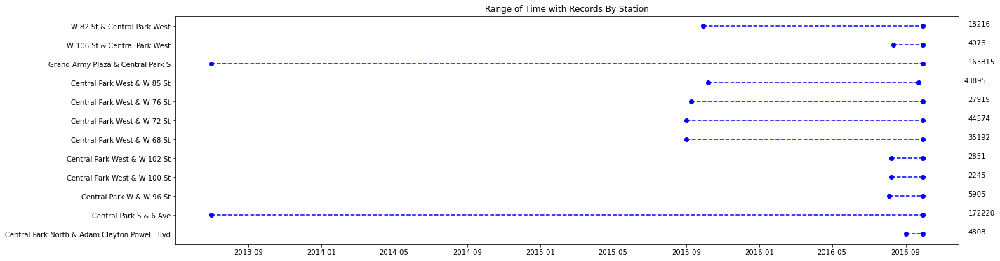

In [6]:
# graph here daily trip count by start_station_name
plt.figure(figsize=(20,6))
for i in range(len(overview)):
    x = [overview['FromDate'][i], overview['ToDate'][i]]
    y = [overview['start_station_name'][i], overview['start_station_name'][i]]
    plt.plot(x, y, 'bo', linestyle="--")
    plt.text(x[1]+timedelta(75), y[0], str(overview['total_trips'][i]))
    plt.title('Range of Time with Records By Station')
plt.show()

In [7]:
query = f"""
WITH
    ALLDATES AS(
        SELECT EXTRACT(DATE from starttime) as date
        FROM `{BQ_SOURCE}`
        WHERE start_station_name LIKE '%Central Park%'
    ),
    KEYS AS(
        SELECT 
            MIN(date) as start_date,
            MAX(date) - CAST(0.025 * DATE_DIFF(MAX(date), MIN(date), DAY) AS INT64) as val_start,
            MAX(date) - CAST(0.0125 * DATE_DIFF(MAX(date), MIN(date), DAY) AS INT64) test_start,
            MAX(date) as end_date
        FROM ALLDATES  
    )
SELECT *, DATE_DIFF(end_date, test_start, DAY)+1 as forecast_horizon
FROM KEYS
"""
keyDates = bigquery.query(query = query).to_dataframe()
keyDates

,start_date,val_start,test_start,end_date,forecast_horizon
0,2013-07-01,2016-08-31,2016-09-15,2016-09-30,16


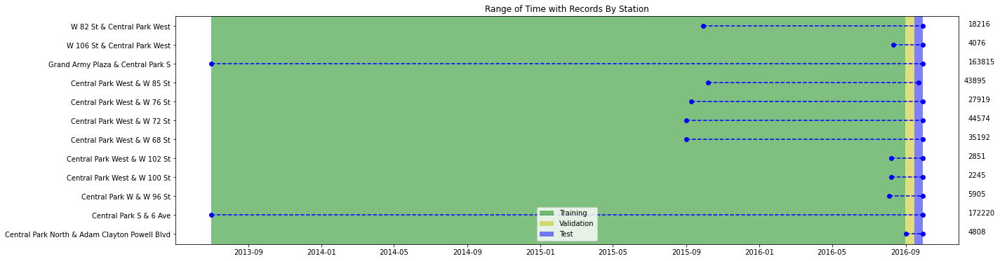

In [51]:
# graph with key dates here
plt.figure(figsize=(20,6))
for i in range(len(overview)):
    x = [overview['FromDate'][i], overview['ToDate'][i]]
    y = [overview['start_station_name'][i], overview['start_station_name'][i]]
    plt.plot(x, y, 'bo', linestyle="--")
    plt.text(x[1]+timedelta(75), y[0], str(overview['total_trips'][i]))
    plt.title('Range of Time with Records By Station')
plt.axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.5, label = 'Training')
plt.axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.5, label = 'Validation')
plt.axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.5, label = 'Test')
plt.legend(loc = 'lower center')
plt.show()

In [52]:
# create data with splits here
query = f"""
CREATE OR REPLACE TABLE `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped` AS
WITH
    DAYS AS(
        SELECT
           start_station_name,
           EXTRACT(DATE from starttime) AS date,
           COUNT(*) AS num_trips
        FROM `{BQ_SOURCE}`
        WHERE start_station_name LIKE '%Central Park%'
        GROUP BY start_station_name, date
    )
SELECT *,
   CASE
       WHEN date < DATE({keyDates['val_start'][0].strftime('%Y, %m, %d')}) THEN "TRAIN"
       WHEN date < DATE({keyDates['test_start'][0].strftime('%Y, %m, %d')}) THEN "VALIDATE"
       ELSE "TEST"
   END AS splits
FROM DAYS
"""
job = bigquery.query(query = query)
job.result()
(job.ended-job.started).total_seconds()

2.05

In [53]:
# review counts by start_station_name and split
query = f"""
SELECT 
    start_station_name,
    COUNTIF(splits='TRAIN') as TRAIN,
    COUNTIF(splits='VALIDATE') as VALIDATE,
    COUNTIF(splits='TEST') as TEST,
    sum(num_trips) as totalTrips
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
GROUP BY start_station_name
ORDER BY start_station_name
"""
splitCounts = bigquery.query(query = query).to_dataframe()
splitCounts

,start_station_name,TRAIN,VALIDATE,TEST,totalTrips
0,Central Park North & Adam Clayton Powell Blvd,0,14,16,4808
1,Central Park S & 6 Ave,1146,15,16,172220
2,Central Park W & W 96 St,27,15,16,5905
3,Central Park West & W 100 St,23,15,16,2245
4,Central Park West & W 102 St,23,15,16,2851
5,Central Park West & W 68 St,328,15,16,35192
6,Central Park West & W 72 St,331,15,15,44574
7,Central Park West & W 76 St,324,15,16,27919
8,Central Park West & W 85 St,321,15,9,43895
9,Grand Army Plaza & Central Park S,1149,15,15,163815


In [54]:
splitCounts[['TRAIN','TEST','VALIDATE']].sum()

TRAIN       4020
TEST         183
VALIDATE     179
dtype: int64

In [55]:
splitCounts[['TRAIN','TEST','VALIDATE']].sum().sum()

4382

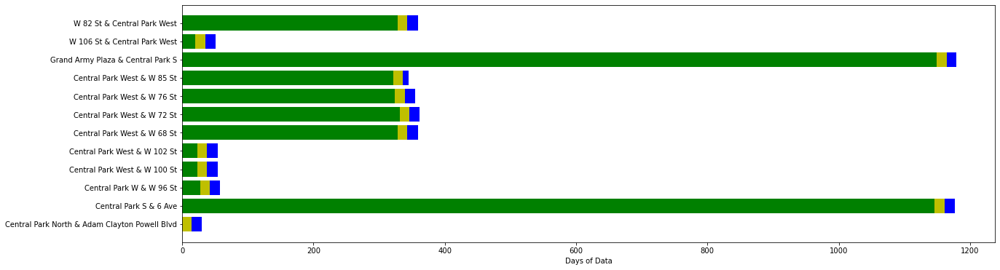

In [56]:
plt.figure(figsize=(20,6))
plt.barh(splitCounts['start_station_name'], splitCounts['TRAIN'], color = 'g')
plt.barh(splitCounts['start_station_name'], splitCounts['VALIDATE'], color = 'y', left = splitCounts['TRAIN'])
plt.barh(splitCounts['start_station_name'], splitCounts['TEST'], color = 'b', left = splitCounts['TRAIN']+splitCounts['VALIDATE'])
plt.xlabel('Days of Data')
plt.show()

In [57]:
# val check here: any station dates with more than 1 row?
query = f"""
WITH
    DAYS AS (
        SELECT start_station_name, date, count(*) as records
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
        GROUP BY start_station_name, date
    )
SELECT *
FROM DAYS
WHERE records > 1
"""
bigquery.query(query = query).to_dataframe()

,start_station_name,date,records


In [58]:
# review series before forecasting
query = f"""
SELECT 
    start_station_name, date, splits, sum(num_trips) as num_trips
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
GROUP BY start_station_name, date, splits
ORDER by start_station_name, date
"""
rawSeries = bigquery.query(query = query).to_dataframe()

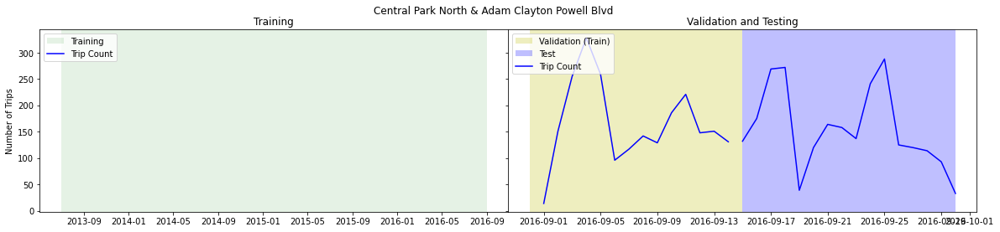

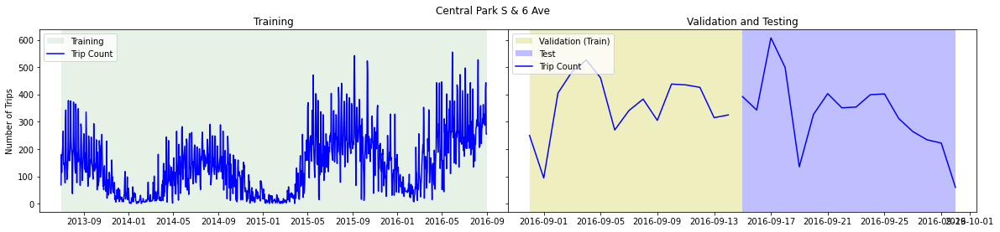

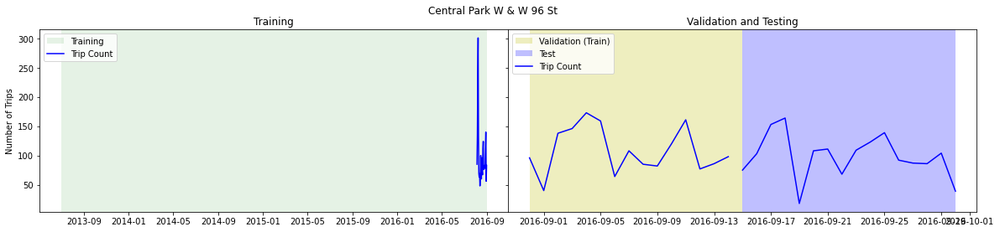

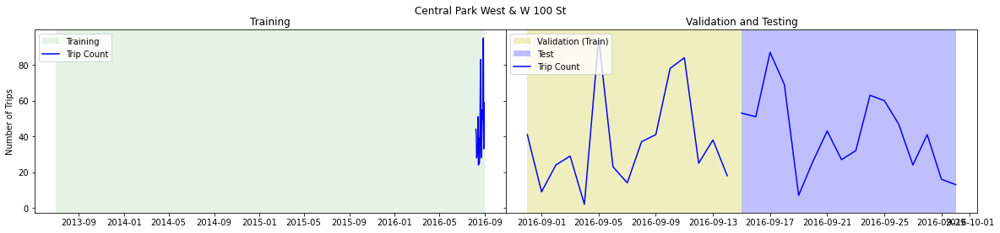

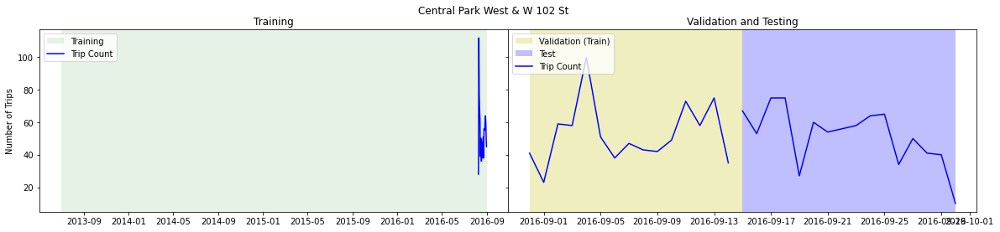

...

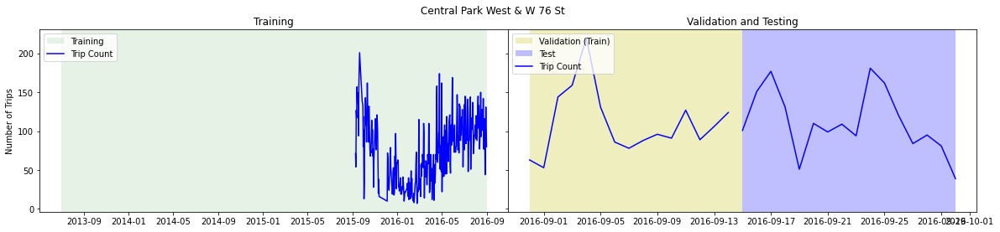

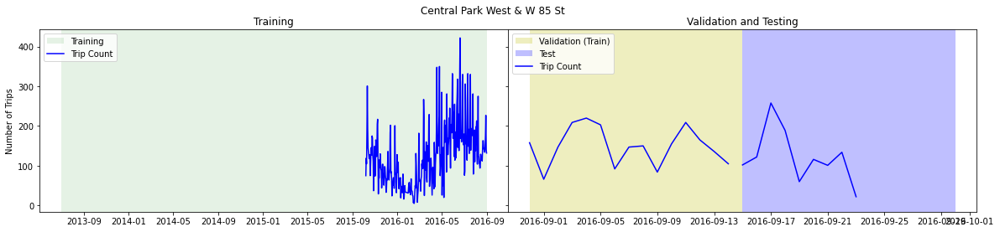

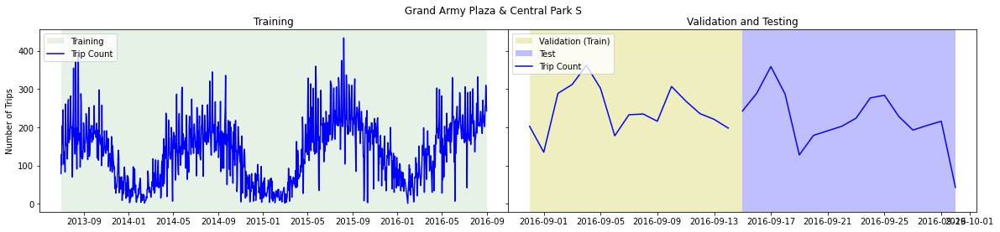

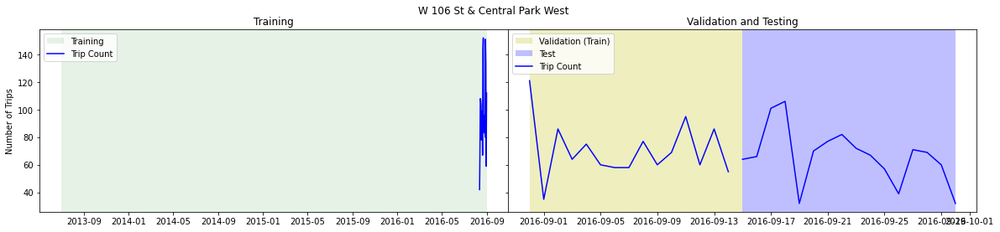

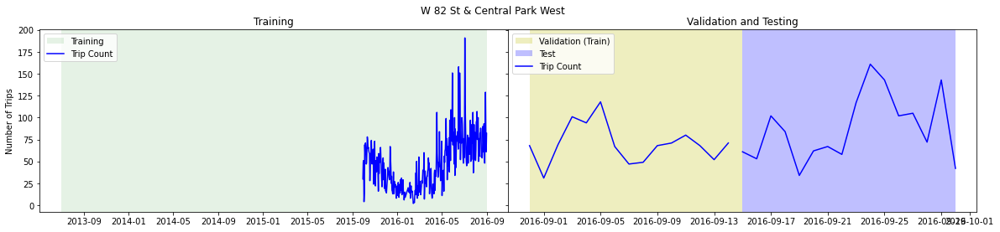

In [59]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

---
## Forecasting: BigQuery ML ArimaPlus

In [24]:
# review series before forecasting
query = f"""
SELECT start_station_name, date, splits, num_trips
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
ORDER by start_station_name, date
"""
rawSeries = bigquery.query(query = query).to_dataframe()

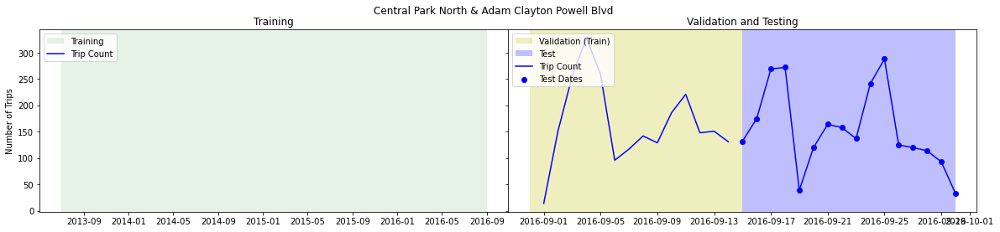

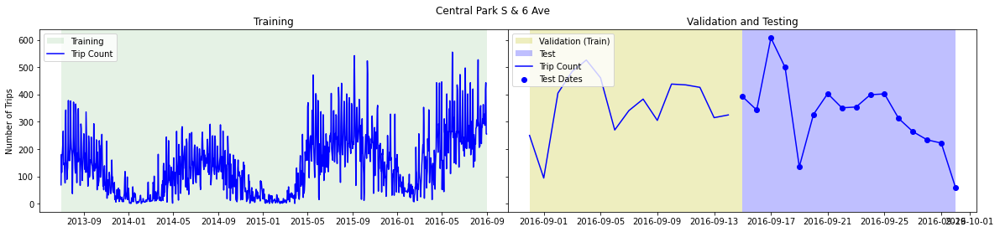

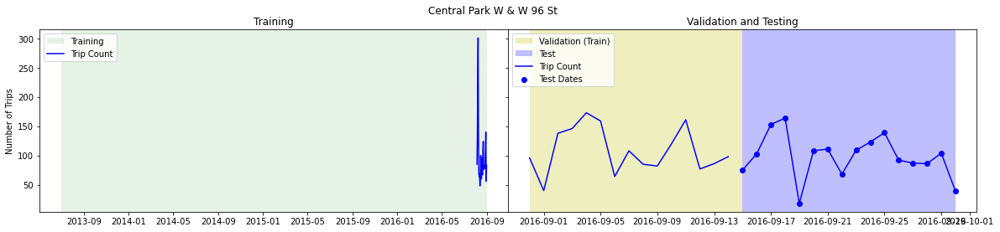

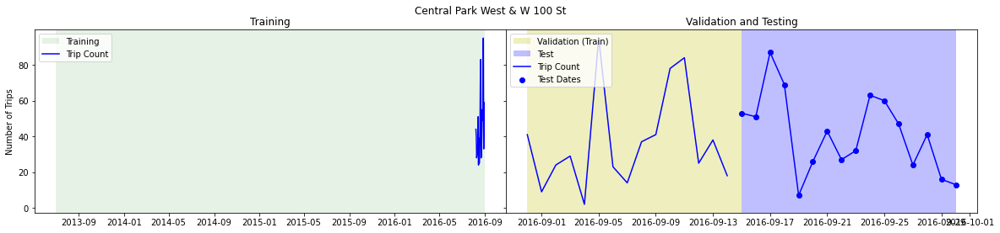

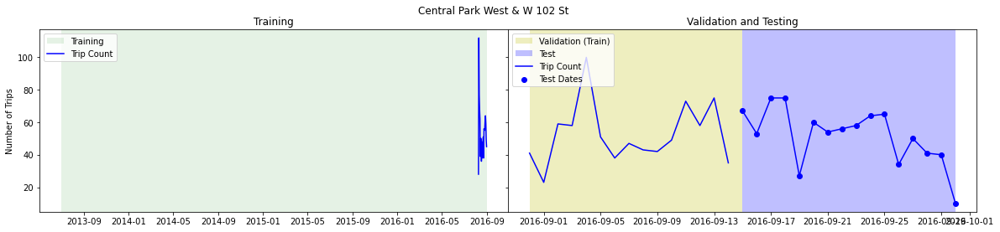

...

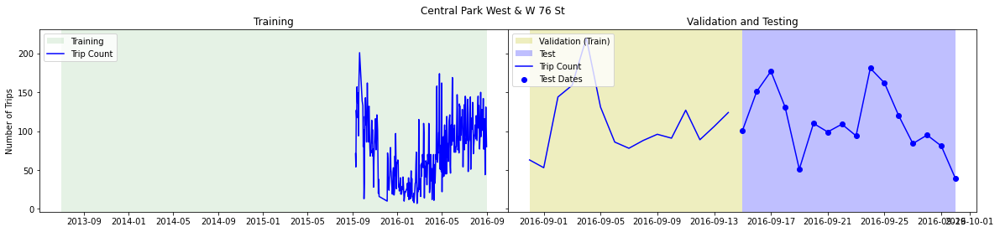

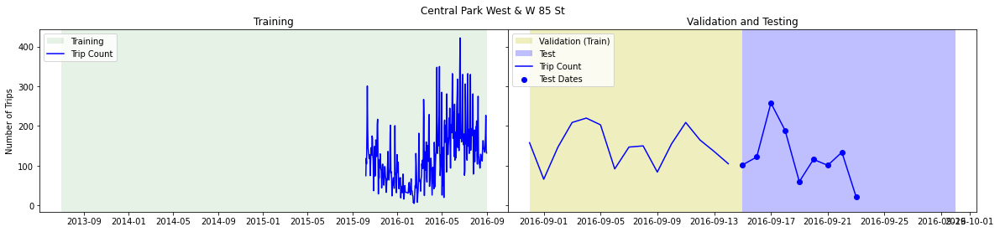

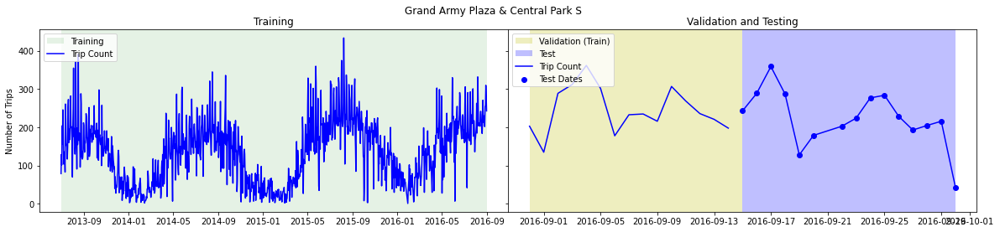

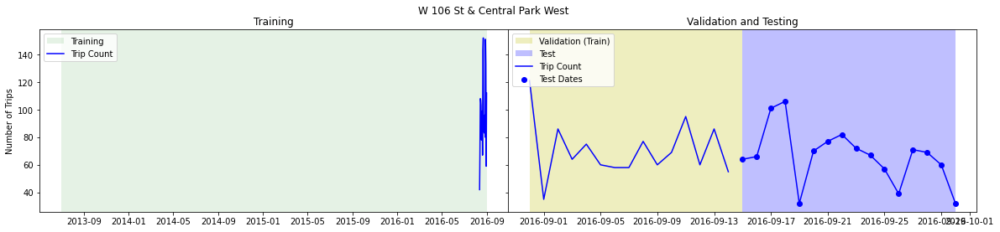

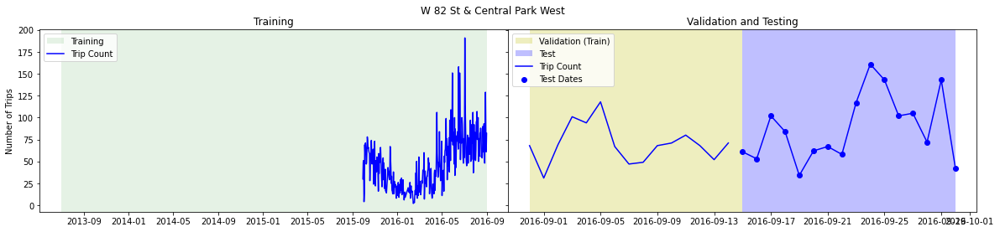

In [72]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [26]:
query = f"""
CREATE OR REPLACE MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`
OPTIONS
  (model_type = 'ARIMA_PLUS',
   time_series_timestamp_col = 'date',
   time_series_data_col = 'num_trips',
   time_series_id_col = 'start_station_name',
   auto_arima_max_order = 5,
   holiday_region = 'US',
   horizon = {keyDates['forecast_horizon'][0]}
  ) AS
SELECT start_station_name, date, num_trips
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
WHERE splits in ('TRAIN','VALIDATE')
"""
job = bigquery.query(query = query)
job.result()
(job.ended-job.started).total_seconds()

20.566

In [27]:
query = f"""
SELECT *
FROM ML.ARIMA_COEFFICIENTS(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`)
ORDER BY start_station_name
"""
coefficients = bigquery.query(query = query).to_dataframe()
coefficients.head()

,start_station_name,ar_coefficients,ma_coefficients,intercept_or_drift
0,Central Park North & Adam Clayton Powell Blvd,[],[0.9999999640039299],161.749646
1,Central Park S & 6 Ave,[],"[-0.7468650398887736, -0.30878496572575914, 0....",0.000000
2,Central Park W & W 96 St,[0.606325881704015],[],103.721273
3,Central Park West & W 100 St,[],[],41.736842
4,Central Park West & W 102 St,[],"[-0.025343644954592202, -0.05536792808495188, ...",51.816338


In [28]:
query = f"""
SELECT *
FROM ML.FEATURE_INFO(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`)
"""
featureInfo = bigquery.query(query = query).to_dataframe()
featureInfo.head()

,input,min,max,mean,median,stddev,category_count,null_count
0,num_trips,1.0,555.0,119.307216,101.0,87.86164,NaN,0
1,date,NaN,NaN,NaN,NaN,NaN,1169.0,0
2,start_station_name,NaN,NaN,NaN,NaN,NaN,12.0,0


In [29]:
query = f"""
SELECT *
FROM ML.TRAINING_INFO(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`)
"""
trainingInfo = bigquery.query(query = query).to_dataframe()
trainingInfo.head()

,training_run,iteration,duration_ms
0,0,0,12317


In [30]:
query = f"""
SELECT *
FROM ML.EVALUATE(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`,
(
    SELECT start_station_name, date, num_trips
    FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
    WHERE splits = 'TEST'
    ORDER BY start_station_name
),
STRUCT(TRUE AS perform_aggregation))
"""
metrics = bigquery.query(query = query).to_dataframe()
metrics

,start_station_name,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error,symmetric_mean_absolute_percentage_error
0,Central Park West & W 102 St,14.590289,319.213461,0.506245,0.316725
1,Central Park S & 6 Ave,91.400310,15064.060542,0.480986,0.330595
2,Central Park West & W 68 St,41.465865,2710.086692,0.432341,0.293868
3,Central Park West & W 100 St,17.937500,461.829120,0.817914,0.476788
4,Central Park West & W 85 St,49.860256,4388.581893,0.879659,0.437451
5,W 82 St & Central Park West,31.413436,1686.031657,0.357959,0.389576
6,Central Park North & Adam Clayton Powell Blvd,45.268184,3681.565016,0.618697,0.364156
7,Central Park West & W 76 St,26.061543,1060.608206,0.324317,0.251017
8,Central Park W & W 96 St,19.477062,884.867149,0.475992,0.241742
9,Central Park West & W 72 St,42.772539,4045.125937,0.569841,0.271215


In [31]:
query = f"""
SELECT *
FROM ML.ARIMA_EVALUATE(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`)
ORDER BY start_station_name
"""
metrics = bigquery.query(query = query).to_dataframe()
metrics

,start_station_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods,has_holiday_effect,has_spikes_and_dips,has_step_changes,error_message
0,Central Park North & Adam Clayton Powell Blvd,0,0,1,False,-70.122200,146.244401,1081.547330,[WEEKLY],False,False,False,
1,Central Park S & 6 Ave,0,1,5,False,-5786.383434,11584.766868,1142.646056,"[WEEKLY, YEARLY]",True,True,True,
2,Central Park W & W 96 St,1,0,0,False,-201.961208,409.922416,869.929192,[WEEKLY],False,False,False,
3,Central Park West & W 100 St,0,0,0,False,-172.112238,348.224475,503.036011,[NO_SEASONALITY],False,False,False,
4,Central Park West & W 102 St,0,0,4,False,-157.912901,327.825803,219.525126,[NO_SEASONALITY],False,False,False,
5,Central Park West & W 68 St,0,1,5,False,-1701.853385,3415.706769,462.146991,[WEEKLY],True,True,True,
6,Central Park West & W 72 St,0,1,5,False,-1826.861828,3665.723656,885.205611,[WEEKLY],True,True,True,
7,Central Park West & W 76 St,1,1,4,True,-1518.167692,3050.335384,209.215743,[WEEKLY],True,True,True,
8,Central Park West & W 85 St,0,1,5,False,-1701.546998,3415.093996,1129.590688,[WEEKLY],False,True,False,
9,Grand Army Plaza & Central Park S,0,1,5,False,-5438.774955,10889.549909,631.214479,"[WEEKLY, YEARLY]",True,True,True,


In [32]:
query = f"""
SELECT *, EXTRACT(DATE FROM time_series_timestamp) AS date
FROM ML.EXPLAIN_FORECAST(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`, STRUCT({keyDates['forecast_horizon'][0]} AS horizon, 0.95 AS confidence_level))
ORDER BY start_station_name, time_series_timestamp
"""
explain = bigquery.query(query = query).to_dataframe()

In [33]:
explain.head()

,start_station_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,date
0,Central Park North & Adam Clayton Powell Blvd,2016-09-01 00:00:00+00:00,history,14.0,14.000000,32.886887,NaN,NaN,NaN,161.749646,NaN,NaN,NaN,-96.338117,NaN,NaN,NaN,NaN,2016-09-01
1,Central Park North & Adam Clayton Powell Blvd,2016-09-02 00:00:00+00:00,history,151.0,106.192560,32.886887,NaN,NaN,NaN,136.043882,NaN,NaN,NaN,-29.851321,NaN,NaN,NaN,NaN,2016-09-02
2,Central Park North & Adam Clayton Powell Blvd,2016-09-03 00:00:00+00:00,history,255.0,244.535205,32.886887,NaN,NaN,NaN,191.621273,NaN,NaN,NaN,52.913932,NaN,NaN,NaN,NaN,2016-09-03
3,Central Park North & Adam Clayton Powell Blvd,2016-09-04 00:00:00+00:00,history,328.0,279.059276,32.886887,NaN,NaN,NaN,169.598243,NaN,NaN,NaN,109.461033,NaN,NaN,NaN,NaN,2016-09-04
4,Central Park North & Adam Clayton Powell Blvd,2016-09-05 00:00:00+00:00,history,259.0,241.319467,32.886887,NaN,NaN,NaN,200.902226,NaN,NaN,NaN,40.417241,NaN,NaN,NaN,NaN,2016-09-05


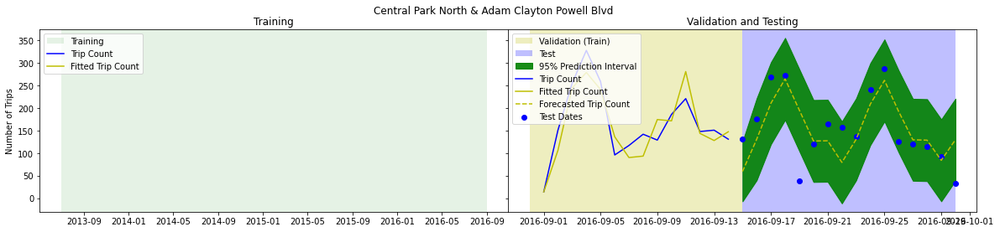

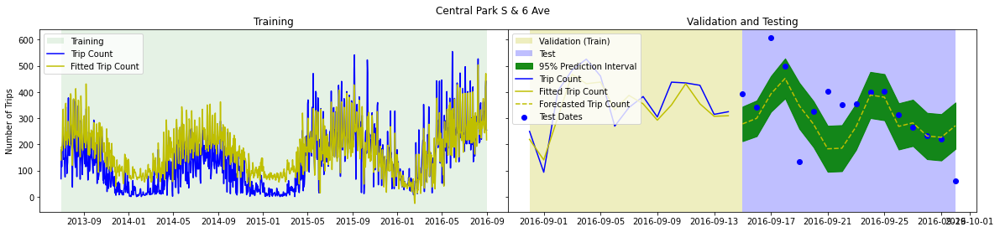

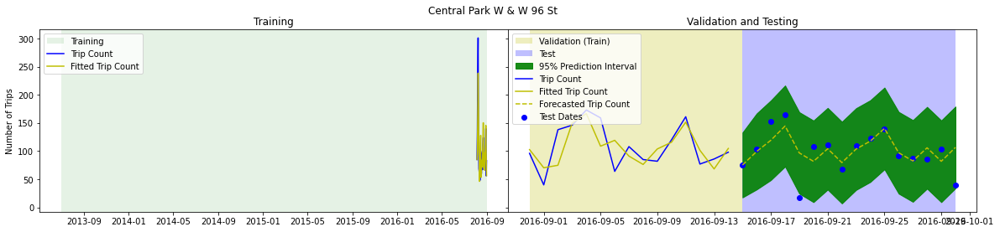

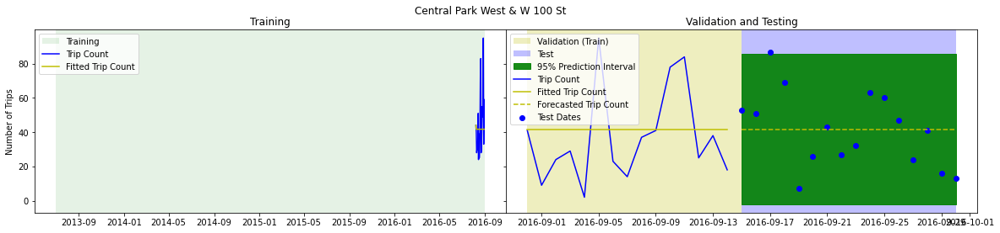

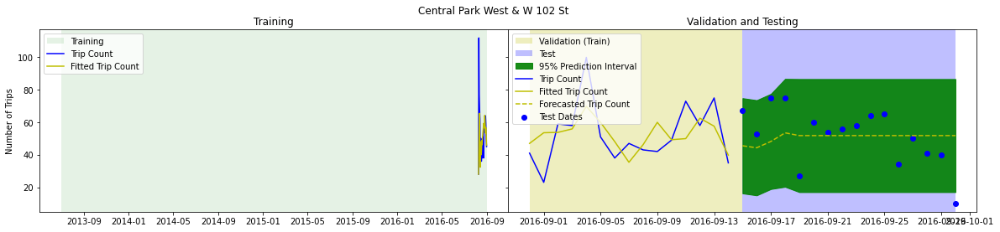

...

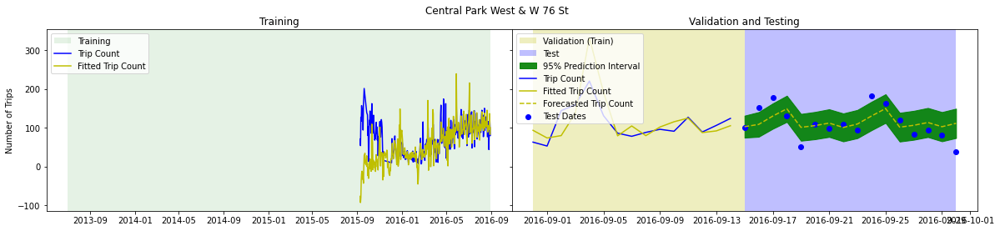

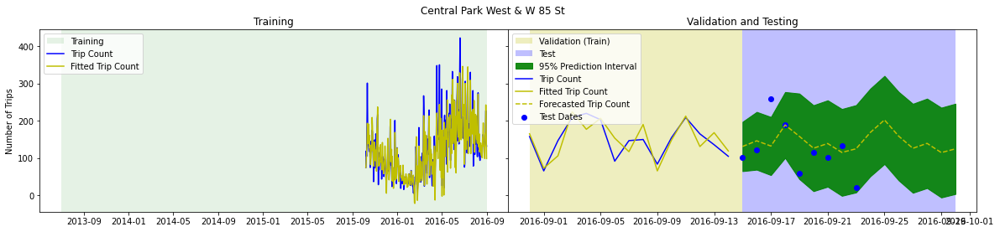

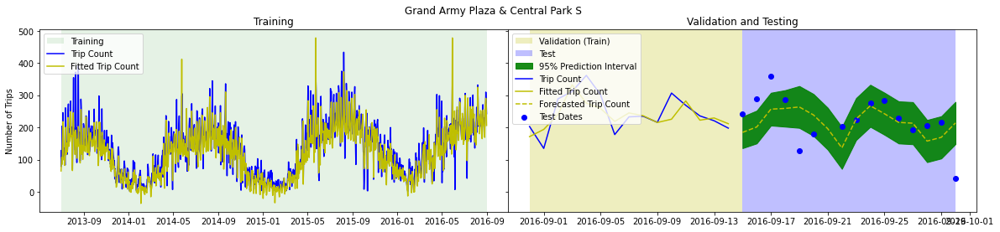

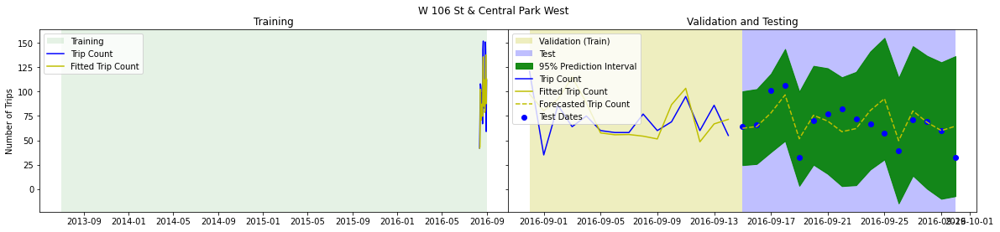

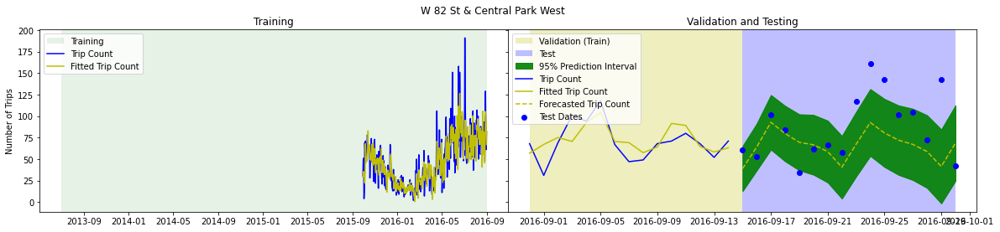

In [76]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_traindf = explain[(explain['start_station_name'] == st) & (explain['date'] < keyDates['val_start'][0])]
    fit_valdf = explain[(explain['start_station_name'] == st) & (explain['date'] >= keyDates['val_start'][0]) & (explain['date'] < keyDates['test_start'][0])]
    fit_testdf = explain[(explain['start_station_name'] == st) & (explain['date'] >= keyDates['test_start'][0])]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    axes[1].fill_between(fit_testdf['date'], fit_testdf['prediction_interval_lower_bound'], fit_testdf['prediction_interval_upper_bound'], color = 'g', alpha = 0.9, label = '95% Prediction Interval')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[0].plot(fit_traindf['date'], fit_traindf['time_series_adjusted_data'], color = 'y', label = 'Fitted Trip Count')
    axes[1].plot(fit_valdf['date'], fit_valdf['time_series_adjusted_data'], color = 'y', label = 'Fitted Trip Count')
    axes[1].plot(fit_testdf['date'], fit_testdf['time_series_adjusted_data'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [36]:
query = f"""
WITH
    EXPLAIN AS (
        SELECT *
        FROM ML.EXPLAIN_FORECAST(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`, STRUCT({keyDates['forecast_horizon'][0]} AS horizon, 0.95 AS confidence_level))
    ),
    DIFFS AS (
        SELECT start_station_name, time_series_timestamp, time_series_type, 100*ABS((time_series_data-time_series_adjusted_data)/(time_series_data)) as percent
        FROM EXPLAIN
        WHERE time_series_type = 'history'
    )
SELECT start_station_name, time_series_type, AVG(percent) AS MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name, time_series_type
ORDER BY start_station_name, time_series_type
"""
MAPE = bigquery.query(query = query).to_dataframe()
MAPE

,start_station_name,time_series_type,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,history,18.229988,14,255.219837
1,Central Park S & 6 Ave,history,228.679719,1172,268012.630242
2,Central Park W & W 96 St,history,25.216826,42,1059.106686
3,Central Park West & W 100 St,history,101.054790,38,3840.082027
4,Central Park West & W 102 St,history,19.631795,38,746.008192
5,Central Park West & W 68 St,history,45.244059,380,17192.742426
6,Central Park West & W 72 St,history,53.594612,380,20365.952377
7,Central Park West & W 76 St,history,50.923809,372,18943.656976
8,Central Park West & W 85 St,history,31.568022,344,10859.399590
9,Grand Army Plaza & Central Park S,history,37.959697,1172,44488.765177


In [37]:
query = f"""
SELECT *
FROM ML.FORECAST(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`, STRUCT(1 AS horizon, 0.95 AS confidence_level))
ORDER BY start_station_name
"""
forecast = bigquery.query(query = query).to_dataframe()
forecast

,start_station_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,Central Park North & Adam Clayton Powell Blvd,2016-09-15 00:00:00+00:00,59.375058,33.965430,0.95,-7.076882,125.826999,-7.076882,125.826999
1,Central Park S & 6 Ave,2016-09-15 00:00:00+00:00,278.530051,33.803048,0.95,212.395804,344.664297,212.395804,344.664297
2,Central Park W & W 96 St,2016-09-15 00:00:00+00:00,75.358337,29.494562,0.95,17.653462,133.063212,17.653462,133.063212
3,Central Park West & W 100 St,2016-09-15 00:00:00+00:00,41.736842,22.428464,0.95,-2.143508,85.617193,-2.143508,85.617193
4,Central Park West & W 102 St,2016-09-15 00:00:00+00:00,45.541468,14.993922,0.95,16.206488,74.876448,16.206488,74.876448
5,Central Park West & W 68 St,2016-09-15 00:00:00+00:00,164.898605,21.497604,0.95,122.839443,206.957767,122.839443,206.957767
6,Central Park West & W 72 St,2016-09-15 00:00:00+00:00,173.550459,29.754780,0.95,115.336480,231.764439,115.336480,231.764439
7,Central Park West & W 76 St,2016-09-15 00:00:00+00:00,102.774954,14.464292,0.95,74.476173,131.073735,74.476173,131.073735
8,Central Park West & W 85 St,2016-09-15 00:00:00+00:00,131.298168,33.802734,0.95,65.164535,197.431800,65.164535,197.431800
9,Grand Army Plaza & Central Park S,2016-09-15 00:00:00+00:00,184.793810,25.123982,0.95,135.639791,233.947828,135.639791,233.947828


In [38]:
query = f"""
WITH
    FORECAST AS (
        SELECT start_station_name, EXTRACT(DATE from forecast_timestamp) AS date, forecast_value
        FROM ML.FORECAST(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`, STRUCT({keyDates['forecast_horizon'][0]} AS horizon, 0.95 AS confidence_level))
    ),
    ACTUAL AS (
        SELECT start_station_name, date, sum(num_trips) as actual_value
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
        WHERE splits = 'TEST'
        GROUP BY start_station_name, date
    ),
    COMBINED AS (
        SELECT *
        FROM FORECAST
        INNER JOIN ACTUAL
        USING (start_station_name, date)  
    ),
    DIFFS AS (
        SELECT start_station_name, date, 'forecast' as time_series_type, 100*ABS((actual_value-forecast_value)/(actual_value)) as percent
        FROM COMBINED
    )
SELECT start_station_name, time_series_type, AVG(percent) AS MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name, time_series_type
ORDER BY start_station_name, time_series_type    
"""
MAPE_F = bigquery.query(query = query).to_dataframe()
MAPE_F

,start_station_name,time_series_type,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,forecast,61.869688,16,989.915015
1,Central Park S & 6 Ave,forecast,48.098645,16,769.578313
2,Central Park W & W 96 St,forecast,47.599211,16,761.587376
3,Central Park West & W 100 St,forecast,81.791387,16,1308.662188
4,Central Park West & W 102 St,forecast,50.624511,16,809.992169
5,Central Park West & W 68 St,forecast,43.234143,16,691.746284
6,Central Park West & W 72 St,forecast,56.984082,15,854.761234
7,Central Park West & W 76 St,forecast,32.431658,16,518.906528
8,Central Park West & W 85 St,forecast,87.965922,9,791.693298
9,Grand Army Plaza & Central Park S,forecast,49.494429,15,742.416439


In [39]:
AllMAPE = MAPE[['start_station_name', 'MAPE', 'n', 'sums']].merge(MAPE_F[['start_station_name','MAPE', 'n', 'sums']], left_on='start_station_name', right_on='start_station_name', suffixes=('_TRAIN', '_TEST'))
AllMAPE

,start_station_name,MAPE_TRAIN,n_TRAIN,sums_TRAIN,MAPE_TEST,n_TEST,sums_TEST
0,Central Park North & Adam Clayton Powell Blvd,18.229988,14,255.219837,61.869688,16,989.915015
1,Central Park S & 6 Ave,228.679719,1172,268012.630242,48.098645,16,769.578313
2,Central Park W & W 96 St,25.216826,42,1059.106686,47.599211,16,761.587376
3,Central Park West & W 100 St,101.054790,38,3840.082027,81.791387,16,1308.662188
4,Central Park West & W 102 St,19.631795,38,746.008192,50.624511,16,809.992169
5,Central Park West & W 68 St,45.244059,380,17192.742426,43.234143,16,691.746284
6,Central Park West & W 72 St,53.594612,380,20365.952377,56.984082,15,854.761234
7,Central Park West & W 76 St,50.923809,372,18943.656976,32.431658,16,518.906528
8,Central Park West & W 85 St,31.568022,344,10859.399590,87.965922,9,791.693298
9,Grand Army Plaza & Central Park S,37.959697,1172,44488.765177,49.494429,15,742.416439


In [40]:
#splitsCounts[['TRAIN','TEST','VALIDATE']].sum().sum()
sums = AllMAPE[['n_TRAIN','sums_TRAIN','n_TEST','sums_TEST']].sum()
sums

n_TRAIN         4339.000000
sums_TRAIN    398617.251457
n_TEST           183.000000
sums_TEST       9195.370725
dtype: float64

In [41]:
TRAIN_MAPE = sums['sums_TRAIN']/sums['n_TRAIN']
TEST_MAPE = sums['sums_TEST']/sums['n_TEST']
TRAIN_MAPE, TEST_MAPE

(91.86846081063398, 50.24792745719036)

In [42]:
query = f"""
SELECT * EXCEPT(date), CAST(DATE(date) AS date) AS date
FROM ML.DETECT_ANOMALIES(MODEL `{PROJECT_ID}.{DATANAME}.{DATANAME}_arimaplus`, STRUCT(0.95 as anomaly_prob_threshold))
WHERE anomaly_probability >= 0.95
"""
anomalies = bigquery.query(query = query).to_dataframe()
anomalies

,start_station_name,num_trips,is_anomaly,lower_bound,upper_bound,anomaly_probability,date
0,Central Park S & 6 Ave,175.0,True,38.894500,171.162994,0.961844,2013-07-04
1,Central Park S & 6 Ave,89.0,True,110.101831,242.370325,0.989808,2013-07-17
2,Central Park S & 6 Ave,378.0,True,144.551864,276.820358,0.999987,2013-07-21
3,Central Park S & 6 Ave,242.0,True,250.654006,382.922500,0.973178,2013-07-28
4,Central Park S & 6 Ave,206.0,True,220.944758,353.213251,0.983400,2013-08-03
...,...,...,...,...,...,...,...
343,W 82 St & Central Park West,95.0,True,39.267577,91.809260,0.971908,2016-08-02
344,W 82 St & Central Park West,55.0,True,55.962319,108.504002,0.957799,2016-08-16
345,W 82 St & Central Park West,61.0,True,65.778204,118.319886,0.979212,2016-08-29
346,W 82 St & Central Park West,31.0,True,40.756482,93.298165,0.992302,2016-09-01


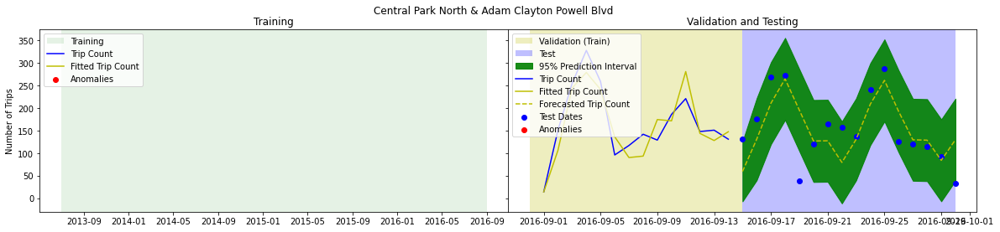

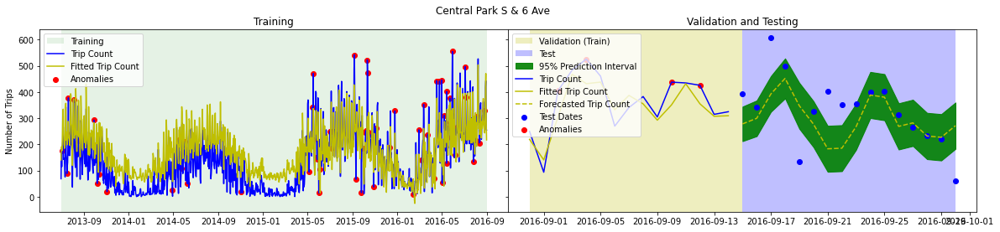

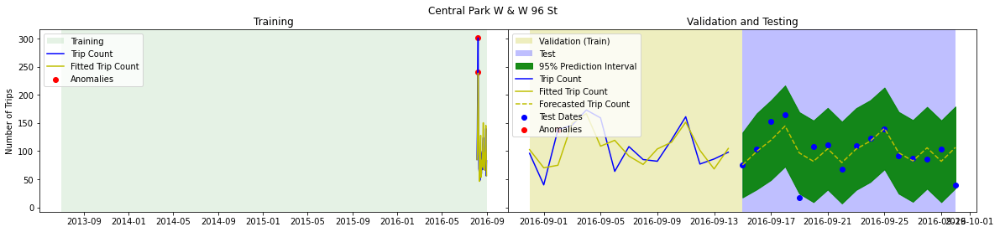

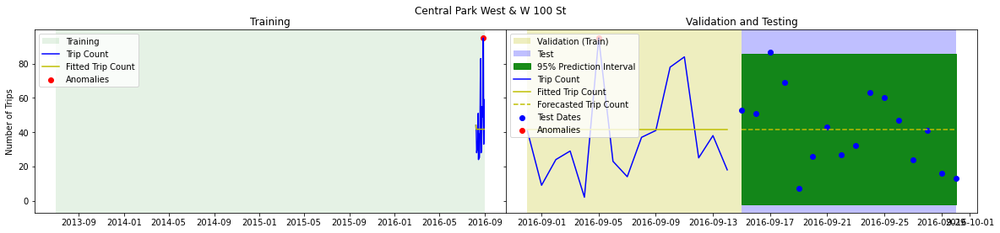

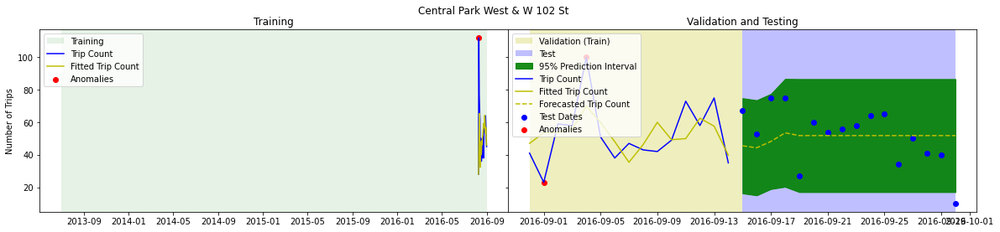

...

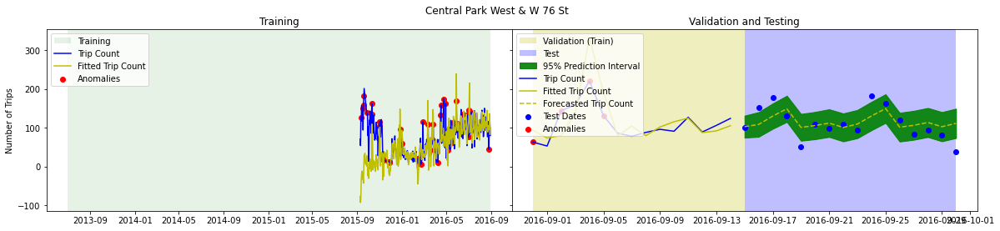

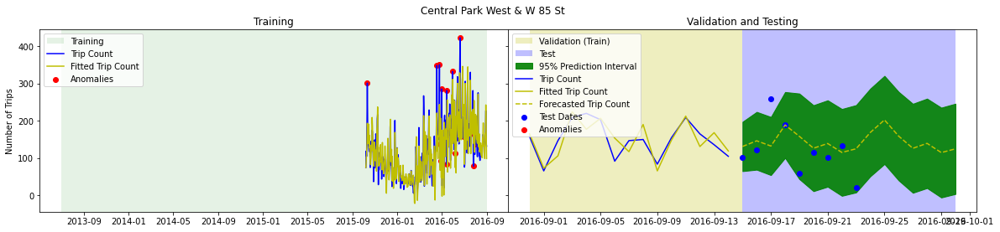

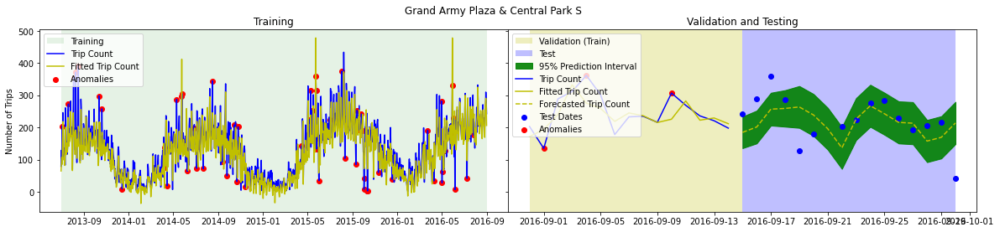

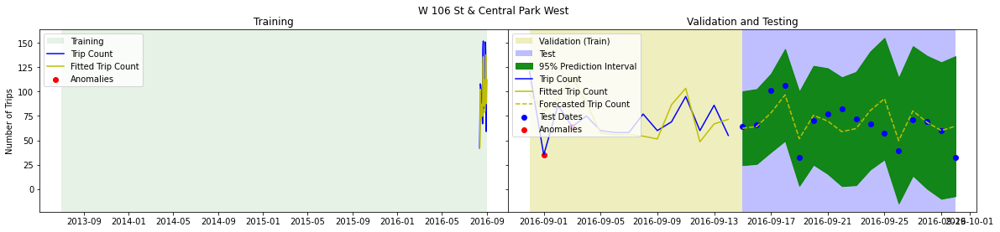

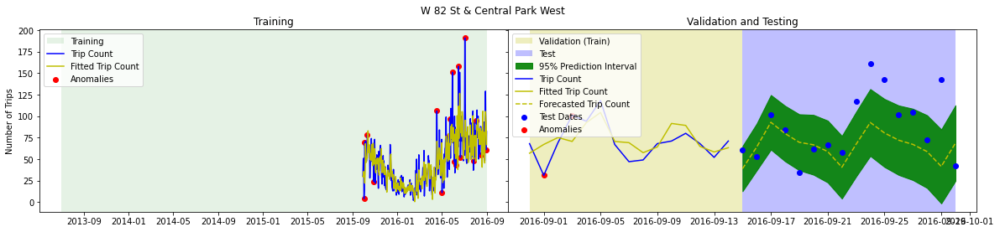

In [78]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_traindf = explain[(explain['start_station_name'] == st) & (explain['date'] < keyDates['val_start'][0])]
    fit_valdf = explain[(explain['start_station_name'] == st) & (explain['date'] >= keyDates['val_start'][0]) & (explain['date'] < keyDates['test_start'][0])]
    fit_testdf = explain[(explain['start_station_name'] == st) & (explain['date'] >= keyDates['test_start'][0])]
    anomalies_traindf = anomalies[(anomalies['start_station_name'] == st) & (anomalies['date'] < keyDates['val_start'][0])]
    anomalies_valdf = anomalies[(anomalies['start_station_name'] == st) & (anomalies['date'] >= keyDates['val_start'][0])]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    axes[1].fill_between(fit_testdf['date'], fit_testdf['prediction_interval_lower_bound'], fit_testdf['prediction_interval_upper_bound'], color = 'g', alpha = 0.9, label = '95% Prediction Interval')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[0].plot(fit_traindf['date'], fit_traindf['time_series_adjusted_data'], color = 'y', label = 'Fitted Trip Count')
    axes[1].plot(fit_valdf['date'], fit_valdf['time_series_adjusted_data'], color = 'y', label = 'Fitted Trip Count')
    axes[1].plot(fit_testdf['date'], fit_testdf['time_series_adjusted_data'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    axes[0].scatter(anomalies_traindf['date'], anomalies_traindf['num_trips'], color = 'r', label = 'Anomalies')
    axes[1].scatter(anomalies_valdf['date'], anomalies_valdf['num_trips'], color = 'r', label = 'Anomalies')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [184]:
# save explain forecast, use data studio
# https://cloud.google.com/bigquery-ml/docs/arima-multiple-time-series-forecasting-tutorial#step_four_forecast_the_time_series_and_visualize_the_results


---
## Forecasting: Vertex AI AutoML Forecasting (Console)

Notes:
- screenshots of workflow are on desktop
- uses forecast horizon = context = 16 days
- when done still need screens
    - trainin job done
    - model
    - bq export table
    - batch prediction of test data

    
    

In [49]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl1`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    )
SELECT *
FROM LEFTSIDE
LEFT OUTER JOIN LEAD
USING (start_station_name, date, prediction_lead_days)
"""
autoML = bigquery.query(query = query).to_dataframe()
autoML

,start_station_name,date,prediction_lead_days,predited_on_date,num_trips,splits,predicted_num_trips
0,Central Park S & 6 Ave,2016-09-15,0,2016-09-15,392,TEST,297.450043
1,Central Park W & W 96 St,2016-09-15,0,2016-09-15,75,TEST,104.204872
2,Central Park West & W 68 St,2016-09-15,0,2016-09-15,170,TEST,158.938278
3,Central Park West & W 72 St,2016-09-15,0,2016-09-15,180,TEST,200.889938
4,Central Park West & W 76 St,2016-09-15,0,2016-09-15,101,TEST,105.757103
...,...,...,...,...,...,...,...
178,Central Park West & W 100 St,2016-09-30,0,2016-09-30,13,TEST,39.432251
179,Central Park West & W 102 St,2016-09-30,0,2016-09-30,10,TEST,49.708858
180,W 106 St & Central Park West,2016-09-30,0,2016-09-30,32,TEST,63.111782
181,Grand Army Plaza & Central Park S,2016-09-30,0,2016-09-30,43,TEST,225.069489


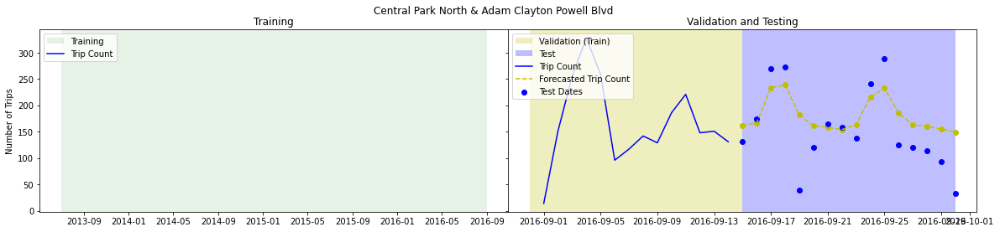

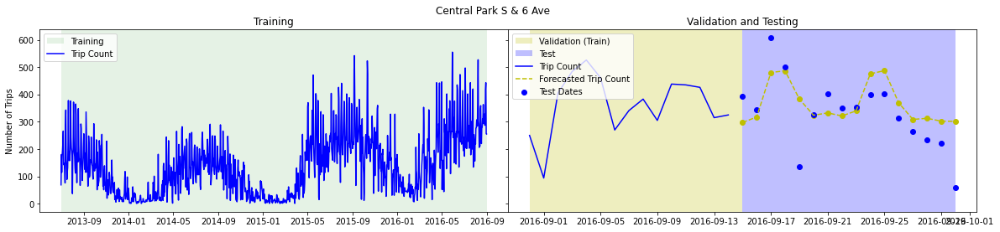

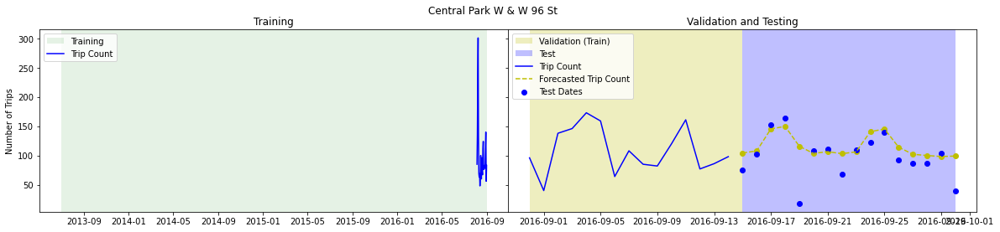

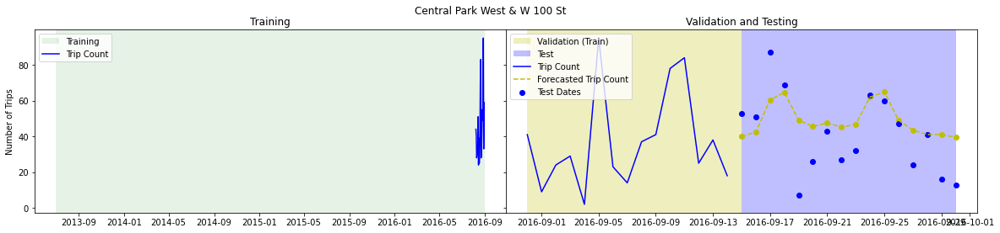

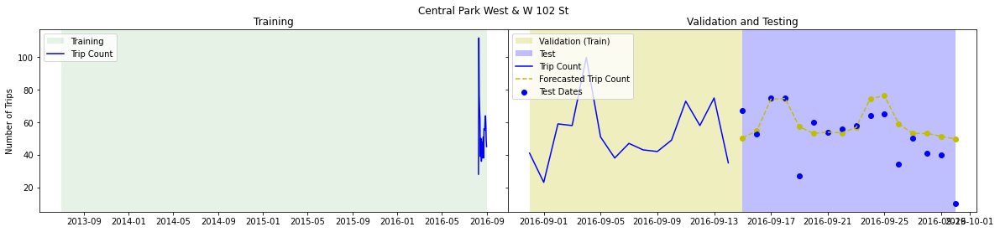

...

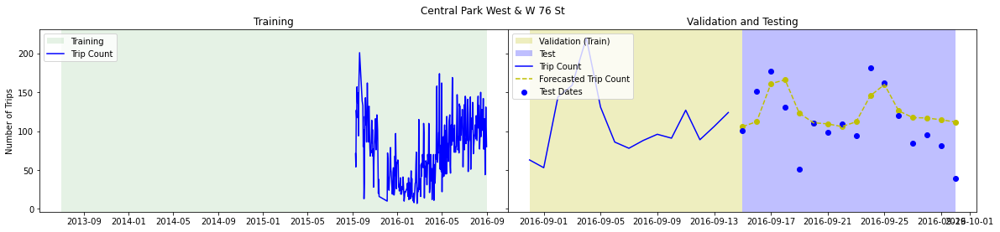

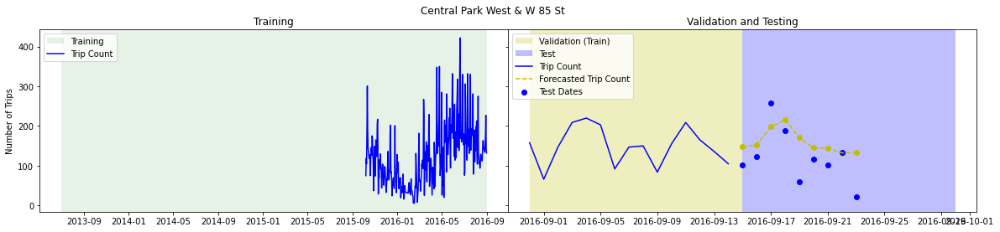

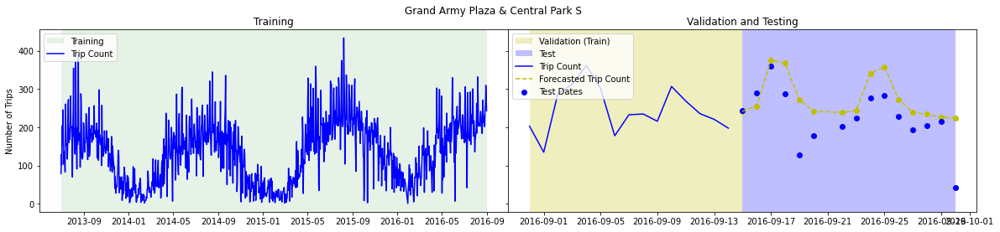

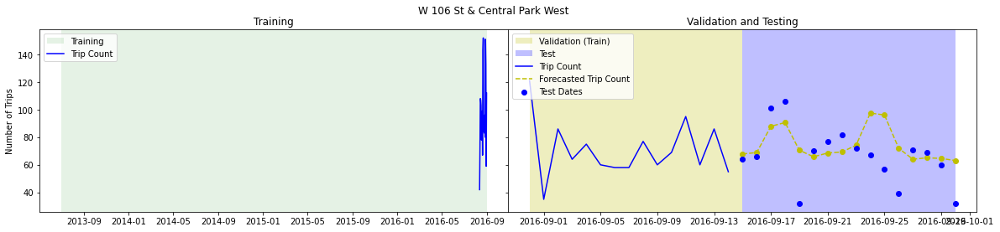

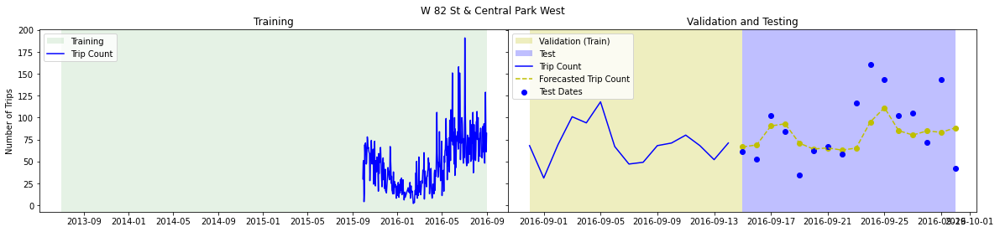

In [60]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[1].plot(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    axes[1].scatter(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [61]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl1`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    ),
    PREDS AS (
        SELECT *
        FROM LEFTSIDE
        LEFT OUTER JOIN LEAD
        USING (start_station_name, date, prediction_lead_days)   
    ),
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-predicted_num_trips)/num_trips) as percent
        FROM PREDS
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_autoML = bigquery.query(query = query).to_dataframe()
MAPE_autoML

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,65.781680,16,1052.506885
1,Central Park S & 6 Ave,51.136070,16,818.177113
2,Central Park W & W 96 St,56.182990,16,898.927847
3,Central Park West & W 100 St,83.340593,16,1333.449489
4,Central Park West & W 102 St,45.543841,16,728.701452
5,Central Park West & W 68 St,44.762503,16,716.200049
6,Central Park West & W 72 St,58.989506,15,884.842591
7,Central Park West & W 76 St,34.877437,16,558.038998
8,Central Park West & W 85 St,96.295093,9,866.655833
9,Grand Army Plaza & Central Park S,50.297640,15,754.464602


In [62]:
MAPE_autoML['sums'].sum() / MAPE_autoML['n'].sum()

52.60436493096482

---
## Forecasting: Vertex AI AutoML Forecasting (API)

Notes:
- Augment console job
- new job with context window = 32, double forecast horizon

In [9]:
from google.cloud import aiplatform

aiplatform.init(project=PROJECT_ID, location=REGION)

In [10]:
TIMESTAMP = datetime.now().strftime("%Y%m%d%H%M%S")

In [121]:
dataset = aiplatform.TimeSeriesDataset.create(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}', 
    bq_source = f'bq://{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped',
    labels = {'notebook':f'{NOTEBOOK}'}
)

INFO:google.cloud.aiplatform.datasets.dataset:Creating TimeSeriesDataset
INFO:google.cloud.aiplatform.datasets.dataset:Create TimeSeriesDataset backing LRO: projects/715288179162/locations/us-central1/datasets/5774234846847041536/operations/3162710631400865792
INFO:google.cloud.aiplatform.datasets.dataset:TimeSeriesDataset created. Resource name: projects/715288179162/locations/us-central1/datasets/5774234846847041536
INFO:google.cloud.aiplatform.datasets.dataset:To use this TimeSeriesDataset in another session:
INFO:google.cloud.aiplatform.datasets.dataset:ds = aiplatform.TimeSeriesDataset('projects/715288179162/locations/us-central1/datasets/5774234846847041536')


In [11]:
dataset = aiplatform.TimeSeriesDataset('projects/715288179162/locations/us-central1/datasets/5774234846847041536')

In [42]:
column_specs = list(set(dataset.column_names) - set(['splits','start_station_name']))
column_specs = dict.fromkeys(column_specs, 'auto')
column_specs

{'num_trips': 'auto', 'date': 'auto'}

In [43]:
PROJECT_ID, NOTEBOOK, DATANAME, TIMESTAMP

('statmike-demo3', 'f-01a', 'citibikes', '20220308005850')

In [44]:
dataset.column_names

['splits', 'start_station_name', 'num_trips', 'date']

In [45]:
forecast_job = aiplatform.AutoMLForecastingTrainingJob(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}',
    optimization_objective = "minimize-rmse",
    column_specs = column_specs,
    labels = {'notebook':f'{NOTEBOOK}'}
)

In [47]:
forecast = forecast_job.run(
    dataset = dataset,
    target_column = "num_trips",
    time_column = "date",
    time_series_identifier_column = "start_station_name",
    unavailable_at_forecast_columns = ["num_trips",],
    available_at_forecast_columns = ["date",],
    forecast_horizon = 16,#keyDates["forecast_horizon"][0],
    data_granularity_unit = "day",
    data_granularity_count = 1,
    predefined_split_column_name = "splits",
    context_window = 32,#2*keyDates["forecast_horizon"][0],
    export_evaluated_data_items = True,
    export_evaluated_data_items_bigquery_destination_uri = f"bq://{PROJECT_ID}:{DATANAME}:automl2",
    validation_options = "fail-pipeline",
    budget_milli_node_hours = 6000,
    model_display_name = f"{NOTEBOOK}_{DATANAME}_{TIMESTAMP}",
    model_labels = {'notebook':f'{NOTEBOOK}'},
)

INFO:google.cloud.aiplatform.training_jobs:View Training:
https://console.cloud.google.com/ai/platform/locations/us-central1/training/1541619755746590720?project=715288179162
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/1541619755746590720 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/1541619755746590720 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/1541619755746590720 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/1541619755746590720 current state:
PipelineState.PIPELINE_STATE_RUNNING
I

In [63]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl2`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    )
SELECT *
FROM LEFTSIDE
LEFT OUTER JOIN LEAD
USING (start_station_name, date, prediction_lead_days)
"""
autoML = bigquery.query(query = query).to_dataframe()
autoML

,start_station_name,date,prediction_lead_days,predited_on_date,num_trips,splits,predicted_num_trips
0,Central Park S & 6 Ave,2016-09-15,0,2016-09-15,392,TEST,310.343079
1,Central Park W & W 96 St,2016-09-15,0,2016-09-15,75,TEST,95.017319
2,Central Park West & W 68 St,2016-09-15,0,2016-09-15,170,TEST,148.188782
3,Central Park West & W 72 St,2016-09-15,0,2016-09-15,180,TEST,188.275742
4,Central Park West & W 76 St,2016-09-15,0,2016-09-15,101,TEST,101.526321
...,...,...,...,...,...,...,...
178,Central Park West & W 100 St,2016-09-30,0,2016-09-30,13,TEST,42.552986
179,Central Park West & W 102 St,2016-09-30,0,2016-09-30,10,TEST,55.400021
180,W 106 St & Central Park West,2016-09-30,0,2016-09-30,32,TEST,68.413017
181,Grand Army Plaza & Central Park S,2016-09-30,0,2016-09-30,43,TEST,246.271439


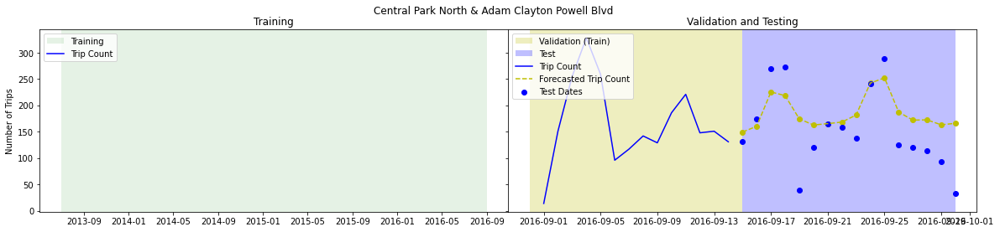

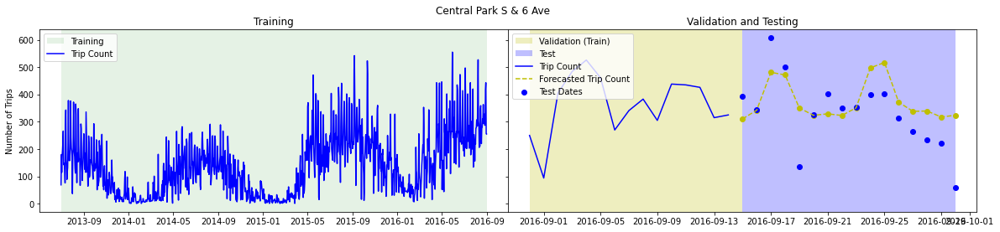

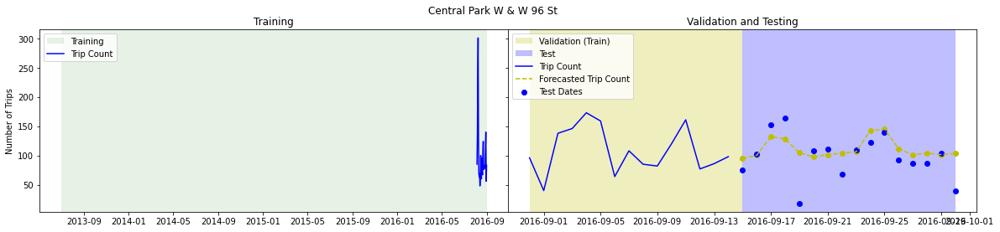

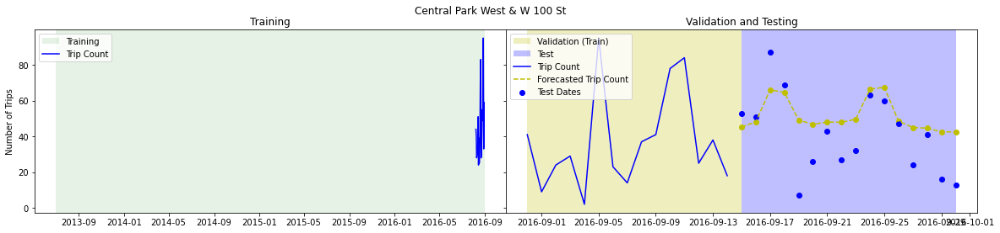

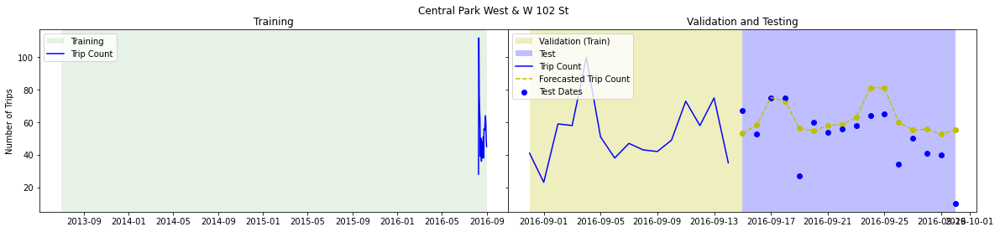

...

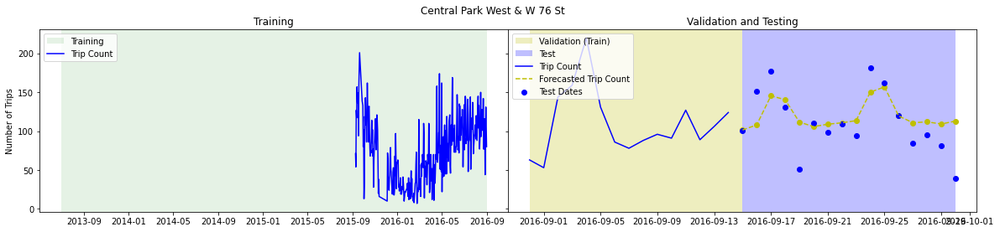

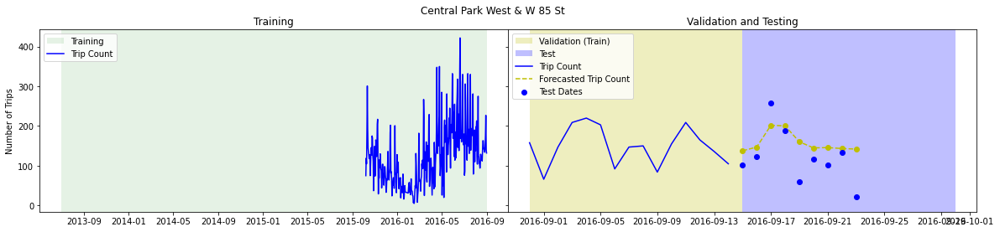

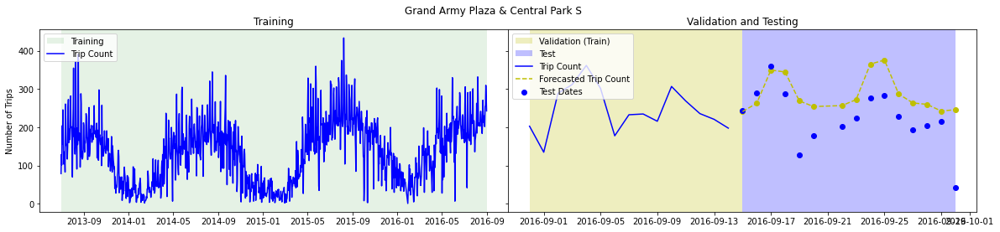

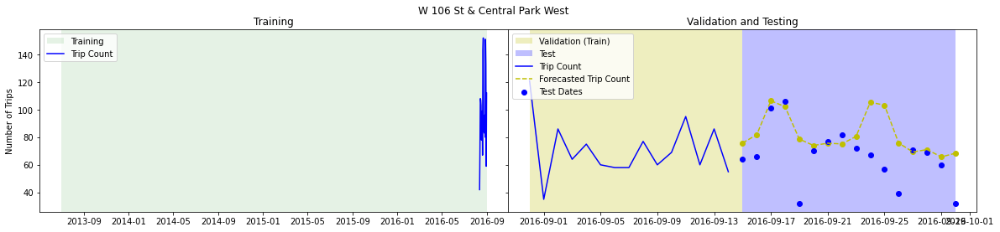

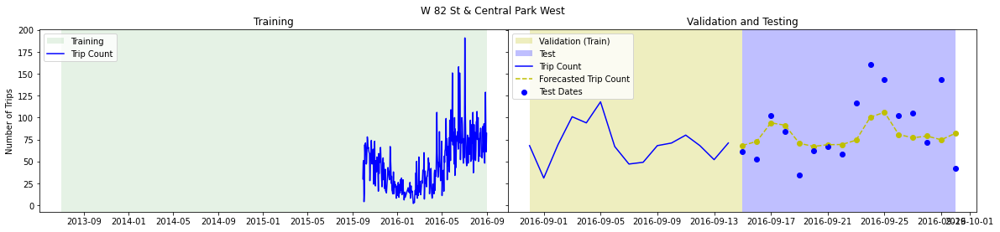

In [64]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[1].plot(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    axes[1].scatter(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [65]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl2`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    ),
    PREDS AS (
        SELECT *
        FROM LEFTSIDE
        LEFT OUTER JOIN LEAD
        USING (start_station_name, date, prediction_lead_days)   
    ),
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-predicted_num_trips)/num_trips) as percent
        FROM PREDS
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_autoML = bigquery.query(query = query).to_dataframe()
MAPE_autoML

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,69.783779,16,1116.540470
1,Central Park S & 6 Ave,53.976182,16,863.618918
2,Central Park W & W 96 St,54.172508,16,866.760125
3,Central Park West & W 100 St,86.689068,16,1387.025083
4,Central Park West & W 102 St,52.004353,16,832.069649
5,Central Park West & W 68 St,45.737723,16,731.803573
6,Central Park West & W 72 St,62.568972,15,938.534573
7,Central Park West & W 76 St,31.528339,16,504.453431
8,Central Park West & W 85 St,96.873256,9,871.859307
9,Grand Army Plaza & Central Park S,58.099573,15,871.493597


In [66]:
MAPE_autoML['sums'].sum() / MAPE_autoML['n'].sum()

55.05730003056782

In [68]:
TIMESTAMP = datetime.now().strftime("%Y%m%d%H%M%S")

In [69]:
forecast_job = aiplatform.AutoMLForecastingTrainingJob(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}',
    optimization_objective = "minimize-rmse",
    column_specs = column_specs,
    labels = {'notebook':f'{NOTEBOOK}'}
)

In [70]:
forecast = forecast_job.run(
    dataset = dataset,
    target_column = "num_trips",
    time_column = "date",
    time_series_identifier_column = "start_station_name",
    unavailable_at_forecast_columns = ["num_trips",],
    available_at_forecast_columns = ["date",],
    forecast_horizon = 16,#keyDates["forecast_horizon"][0],
    data_granularity_unit = "day",
    data_granularity_count = 1,
    predefined_split_column_name = "splits",
    context_window = 8,#2*keyDates["forecast_horizon"][0],
    export_evaluated_data_items = True,
    export_evaluated_data_items_bigquery_destination_uri = f"bq://{PROJECT_ID}:{DATANAME}:automl3",
    validation_options = "fail-pipeline",
    budget_milli_node_hours = 3000,
    model_display_name = f"{NOTEBOOK}_{DATANAME}_{TIMESTAMP}",
    model_labels = {'notebook':f'{NOTEBOOK}'},
    sync = False
)

INFO:google.cloud.aiplatform.training_jobs:View Training:
https://console.cloud.google.com/ai/platform/locations/us-central1/training/8751601284190044160?project=715288179162
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/8751601284190044160 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/8751601284190044160 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/8751601284190044160 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/8751601284190044160 current state:
PipelineState.PIPELINE_STATE_RUNNING
I

In [71]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl3`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    )
SELECT *
FROM LEFTSIDE
LEFT OUTER JOIN LEAD
USING (start_station_name, date, prediction_lead_days)
"""
autoML = bigquery.query(query = query).to_dataframe()
autoML

,start_station_name,date,prediction_lead_days,predited_on_date,num_trips,splits,predicted_num_trips
0,Central Park S & 6 Ave,2016-09-15,0,2016-09-15,392,TEST,290.118683
1,Central Park W & W 96 St,2016-09-15,0,2016-09-15,75,TEST,97.059593
2,Central Park West & W 68 St,2016-09-15,0,2016-09-15,170,TEST,147.124008
3,Central Park West & W 72 St,2016-09-15,0,2016-09-15,180,TEST,189.670273
4,Central Park West & W 76 St,2016-09-15,0,2016-09-15,101,TEST,96.110413
...,...,...,...,...,...,...,...
178,Central Park West & W 100 St,2016-09-30,0,2016-09-30,13,TEST,40.200298
179,Central Park West & W 102 St,2016-09-30,0,2016-09-30,10,TEST,51.784931
180,W 106 St & Central Park West,2016-09-30,0,2016-09-30,32,TEST,65.716408
181,Grand Army Plaza & Central Park S,2016-09-30,0,2016-09-30,43,TEST,220.767929


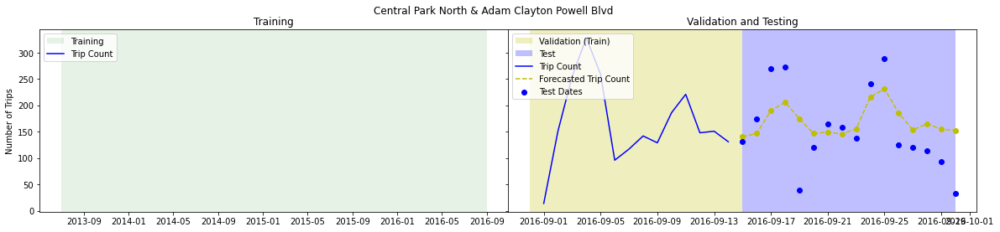

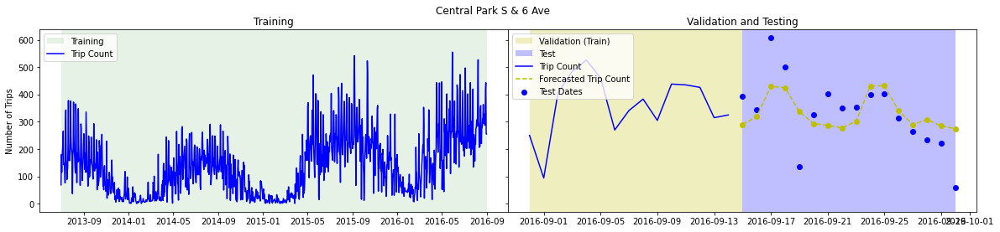

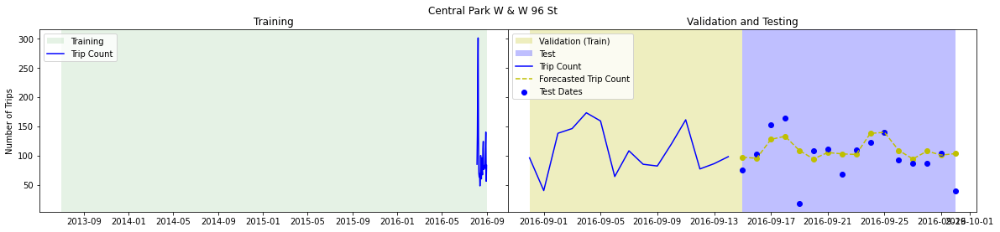

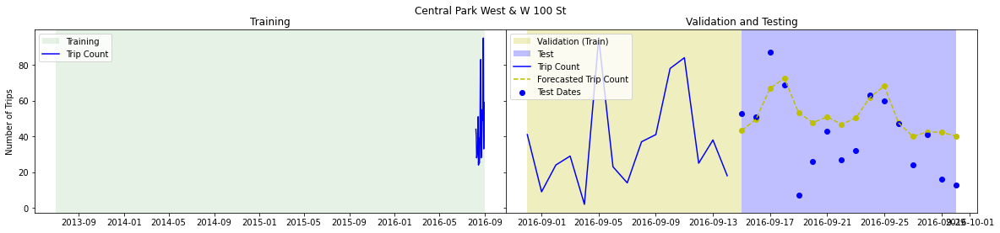

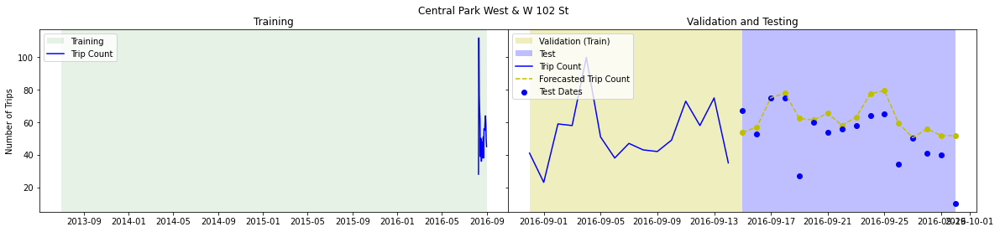

...

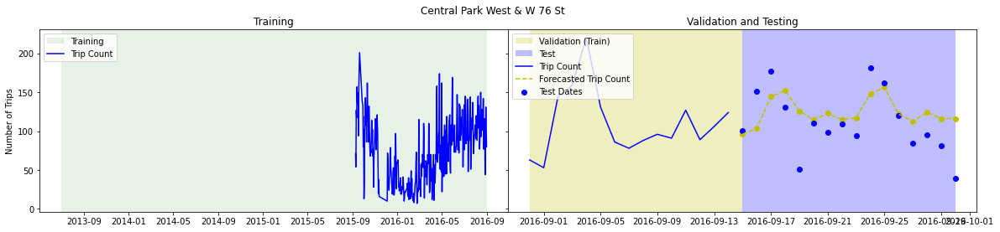

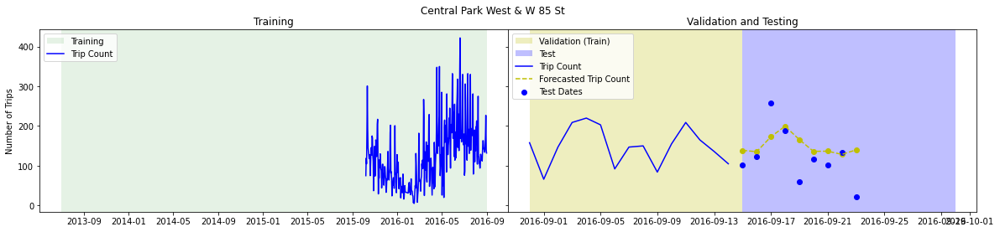

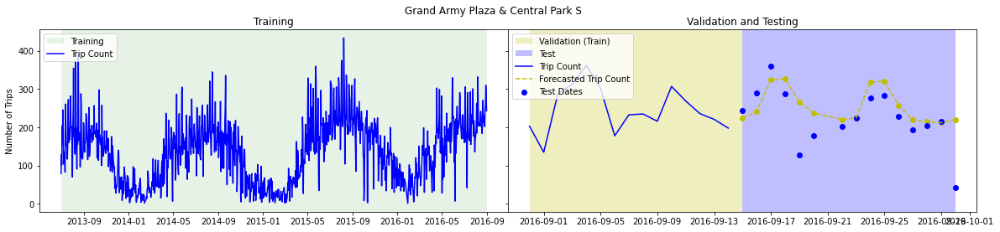

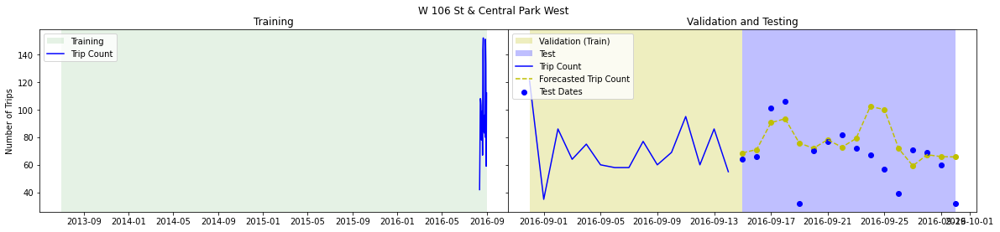

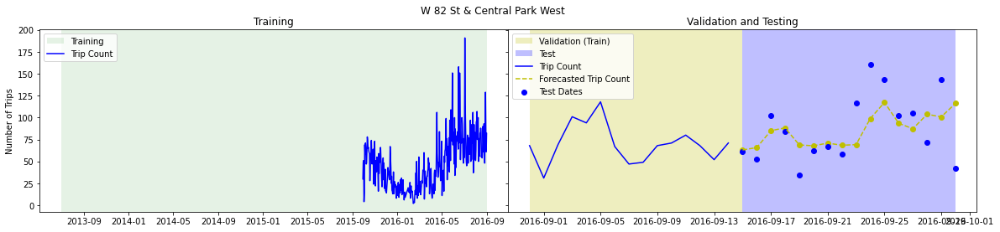

In [72]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[1].plot(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    axes[1].scatter(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [73]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl3`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    ),
    PREDS AS (
        SELECT *
        FROM LEFTSIDE
        LEFT OUTER JOIN LEAD
        USING (start_station_name, date, prediction_lead_days)   
    ),
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-predicted_num_trips)/num_trips) as percent
        FROM PREDS
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_autoML = bigquery.query(query = query).to_dataframe()
MAPE_autoML

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,66.037363,16,1056.597800
1,Central Park S & 6 Ave,47.088295,16,753.412728
2,Central Park W & W 96 St,55.224130,16,883.586087
3,Central Park West & W 100 St,87.614942,16,1401.839079
4,Central Park West & W 102 St,50.115655,16,801.850488
5,Central Park West & W 68 St,44.247706,16,707.963294
6,Central Park West & W 72 St,55.579683,15,833.695249
7,Central Park West & W 76 St,37.851725,16,605.627594
8,Central Park West & W 85 St,94.968152,9,854.713366
9,Grand Army Plaza & Central Park S,44.776488,15,671.647324


In [74]:
MAPE_autoML['sums'].sum() / MAPE_autoML['n'].sum()

52.86709637821661

In [205]:
TIMESTAMP = datetime.now().strftime("%Y%m%d%H%M%S")

In [206]:
forecast_job = aiplatform.AutoMLForecastingTrainingJob(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}',
    optimization_objective = "minimize-rmse",
    column_specs = column_specs,
    labels = {'notebook':f'{NOTEBOOK}'}
)

In [207]:
forecast = forecast_job.run(
    dataset = dataset,
    target_column = "num_trips",
    time_column = "date",
    time_series_identifier_column = "start_station_name",
    unavailable_at_forecast_columns = ["num_trips",],
    available_at_forecast_columns = ["date",],
    forecast_horizon = 16,#keyDates["forecast_horizon"][0],
    data_granularity_unit = "day",
    data_granularity_count = 1,
    predefined_split_column_name = "splits",
    context_window = 0,#2*keyDates["forecast_horizon"][0],
    export_evaluated_data_items = True,
    export_evaluated_data_items_bigquery_destination_uri = f"bq://{PROJECT_ID}:{DATANAME}:automl4",
    validation_options = "fail-pipeline",
    budget_milli_node_hours = 3000,
    model_display_name = f"{NOTEBOOK}_{DATANAME}_{TIMESTAMP}",
    model_labels = {'notebook':f'{NOTEBOOK}'},
    sync = False
)

INFO:google.cloud.aiplatform.training_jobs:View Training:
https://console.cloud.google.com/ai/platform/locations/us-central1/training/5755915883616665600?project=715288179162
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/5755915883616665600 current state:
PipelineState.PIPELINE_STATE_RUNNING


In [258]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl4`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    )
SELECT *
FROM LEFTSIDE
LEFT OUTER JOIN LEAD
USING (start_station_name, date, prediction_lead_days)
"""
autoML = bigquery.query(query = query).to_dataframe()
autoML

,start_station_name,date,prediction_lead_days,predited_on_date,num_trips,splits,predicted_num_trips
0,Central Park S & 6 Ave,2016-09-15,0,2016-09-15,392,TEST,126.880104
1,Central Park S & 6 Ave,2016-09-16,0,2016-09-16,343,TEST,133.714081
2,Central Park S & 6 Ave,2016-09-17,0,2016-09-17,607,TEST,178.647263
3,Central Park S & 6 Ave,2016-09-18,0,2016-09-18,499,TEST,180.654419
4,Central Park S & 6 Ave,2016-09-19,0,2016-09-19,135,TEST,142.240402
...,...,...,...,...,...,...,...
178,Central Park North & Adam Clayton Powell Blvd,2016-09-26,0,2016-09-26,125,TEST,158.555252
179,Central Park North & Adam Clayton Powell Blvd,2016-09-27,0,2016-09-27,120,TEST,141.864914
180,Central Park North & Adam Clayton Powell Blvd,2016-09-28,0,2016-09-28,114,TEST,135.971664
181,Central Park North & Adam Clayton Powell Blvd,2016-09-29,0,2016-09-29,93,TEST,135.262009


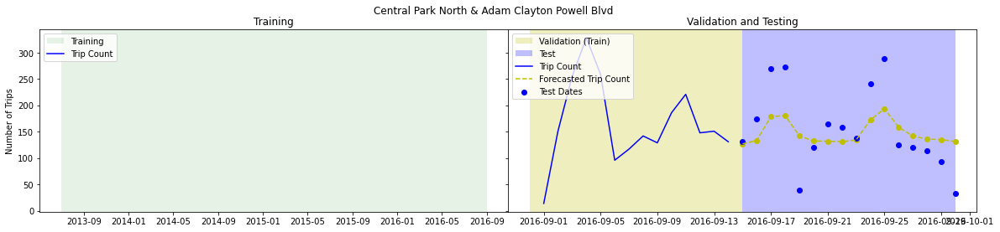

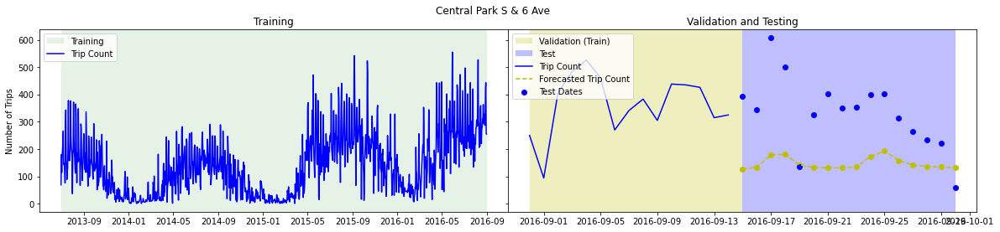

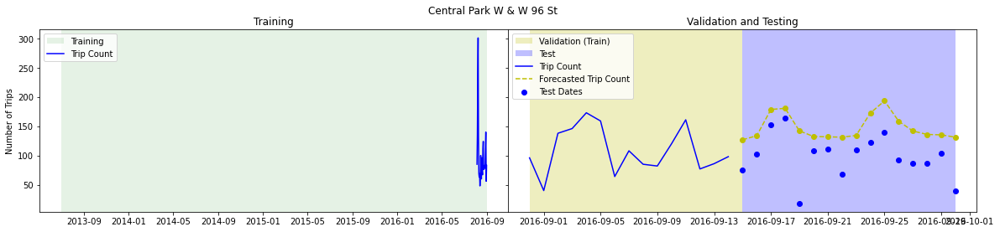

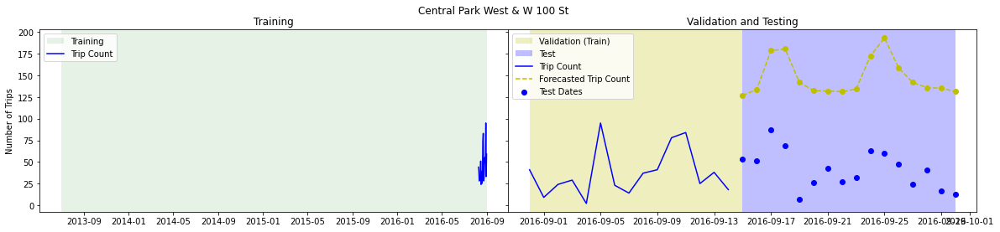

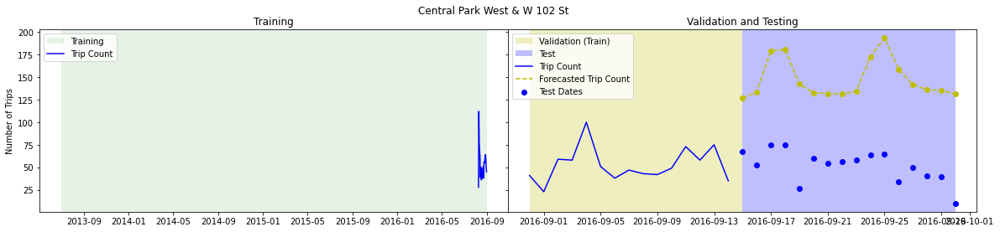

...

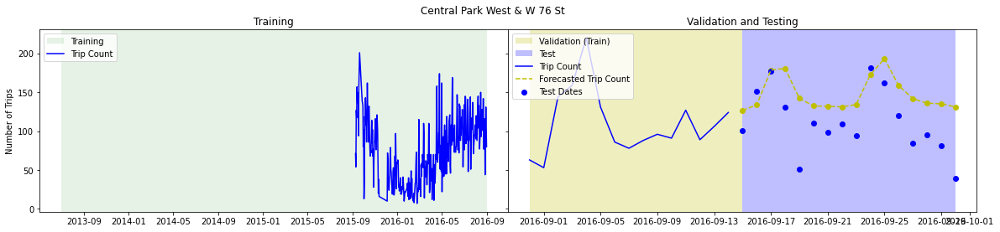

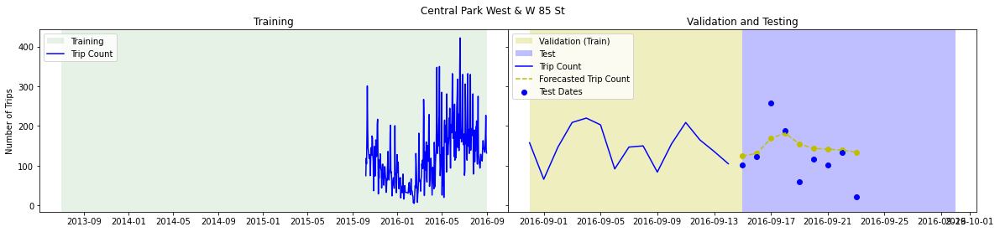

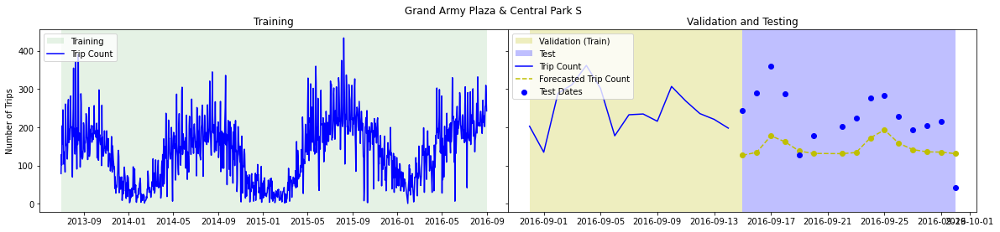

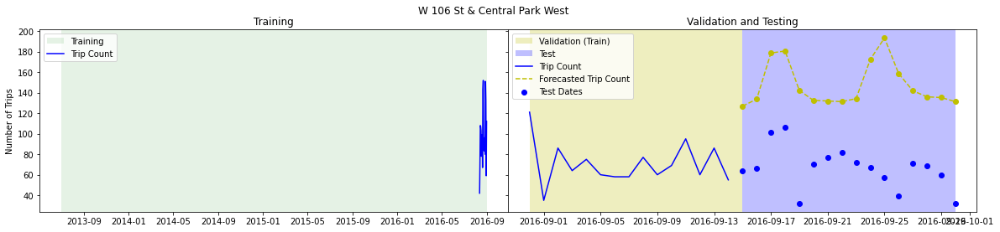

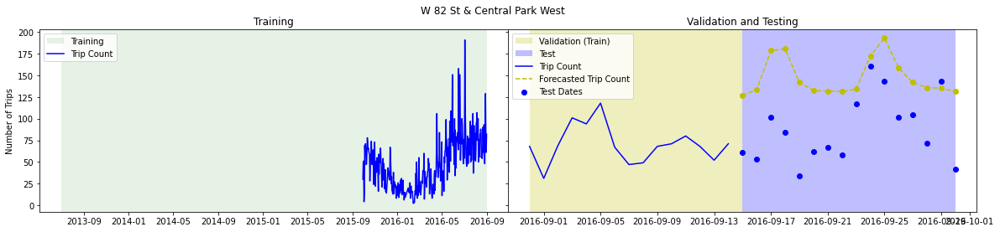

In [259]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[1].plot(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    axes[1].scatter(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [260]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl4`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    ),
    PREDS AS (
        SELECT *
        FROM LEFTSIDE
        LEFT OUTER JOIN LEAD
        USING (start_station_name, date, prediction_lead_days)   
    ),
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-predicted_num_trips)/num_trips) as percent
        FROM PREDS
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_autoML = bigquery.query(query = query).to_dataframe()
MAPE_autoML

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,54.813569,16,877.017103
1,Central Park S & 6 Ave,57.726145,16,923.618318
2,Central Park W & W 96 St,94.571556,16,1513.144896
3,Central Park West & W 100 St,427.092998,16,6833.487966
4,Central Park West & W 102 St,254.839315,16,4077.429044
5,Central Park West & W 68 St,36.725715,16,587.611434
6,Central Park West & W 72 St,45.154584,15,677.318758
7,Central Park West & W 76 St,52.715474,16,843.447581
8,Central Park West & W 85 St,89.396037,9,804.564330
9,Grand Army Plaza & Central Park S,47.179341,15,707.690118


In [261]:
MAPE_autoML['sums'].sum() / MAPE_autoML['n'].sum()

118.80109019751701

In [ ]:
## try 5 = cw = 2

In [279]:
TIMESTAMP = datetime.now().strftime("%Y%m%d%H%M%S")

In [280]:
forecast_job = aiplatform.AutoMLForecastingTrainingJob(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}',
    optimization_objective = "minimize-rmse",
    column_specs = column_specs,
    labels = {'notebook':f'{NOTEBOOK}'}
)

In [281]:
forecast = forecast_job.run(
    dataset = dataset,
    target_column = "num_trips",
    time_column = "date",
    time_series_identifier_column = "start_station_name",
    unavailable_at_forecast_columns = ["num_trips",],
    available_at_forecast_columns = ["date",],
    forecast_horizon = 16,#keyDates["forecast_horizon"][0],
    data_granularity_unit = "day",
    data_granularity_count = 1,
    predefined_split_column_name = "splits",
    context_window = 2,#2*keyDates["forecast_horizon"][0],
    export_evaluated_data_items = True,
    export_evaluated_data_items_bigquery_destination_uri = f"bq://{PROJECT_ID}:{DATANAME}:automl5",
    validation_options = "fail-pipeline",
    budget_milli_node_hours = 1000,
    model_display_name = f"{NOTEBOOK}_{DATANAME}_{TIMESTAMP}",
    model_labels = {'notebook':f'{NOTEBOOK}'},
    sync = False
)

INFO:google.cloud.aiplatform.training_jobs:View Training:
https://console.cloud.google.com/ai/platform/locations/us-central1/training/5717213074318950400?project=715288179162
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/5717213074318950400 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/5717213074318950400 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/5717213074318950400 current state:
PipelineState.PIPELINE_STATE_RUNNING
INFO:google.cloud.aiplatform.training_jobs:AutoMLForecastingTrainingJob projects/715288179162/locations/us-central1/trainingPipelines/5717213074318950400 current state:
PipelineState.PIPELINE_STATE_RUNNING
I

In [282]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl5`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    )
SELECT *
FROM LEFTSIDE
LEFT OUTER JOIN LEAD
USING (start_station_name, date, prediction_lead_days)
"""
autoML = bigquery.query(query = query).to_dataframe()
autoML

,start_station_name,date,prediction_lead_days,predited_on_date,num_trips,splits,predicted_num_trips
0,Central Park S & 6 Ave,2016-09-15,0,2016-09-15,392,TEST,267.958069
1,Central Park W & W 96 St,2016-09-15,0,2016-09-15,75,TEST,95.954102
2,Central Park West & W 68 St,2016-09-15,0,2016-09-15,170,TEST,149.204865
3,Central Park West & W 72 St,2016-09-15,0,2016-09-15,180,TEST,165.270279
4,Central Park West & W 76 St,2016-09-15,0,2016-09-15,101,TEST,116.863731
...,...,...,...,...,...,...,...
178,Central Park West & W 100 St,2016-09-30,0,2016-09-30,13,TEST,38.295269
179,Central Park West & W 102 St,2016-09-30,0,2016-09-30,10,TEST,46.472149
180,W 106 St & Central Park West,2016-09-30,0,2016-09-30,32,TEST,66.549294
181,Grand Army Plaza & Central Park S,2016-09-30,0,2016-09-30,43,TEST,193.063477


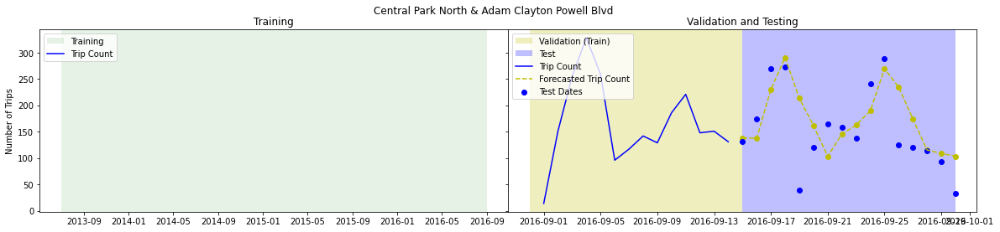

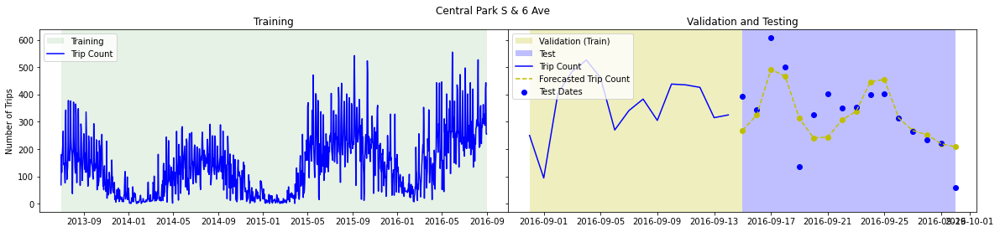

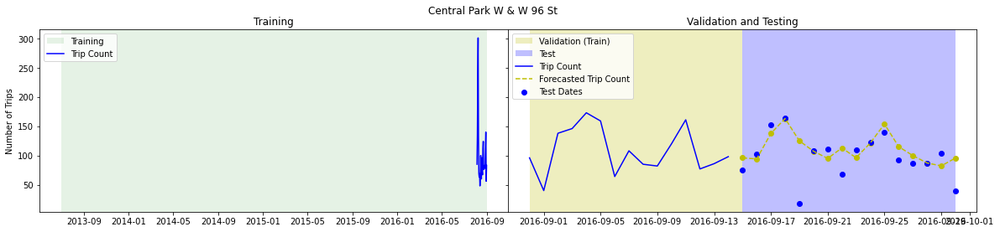

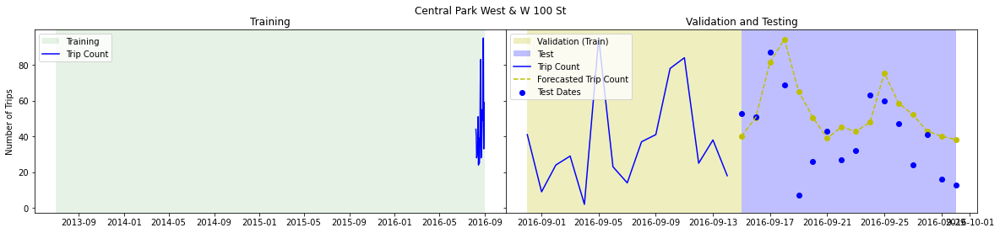

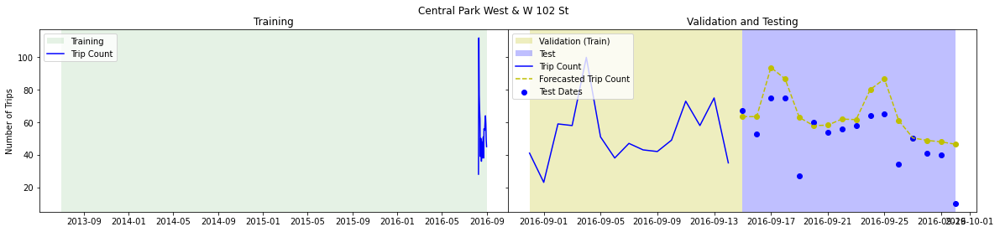

...

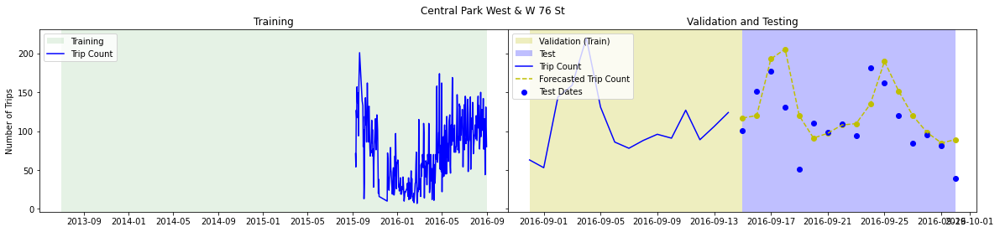

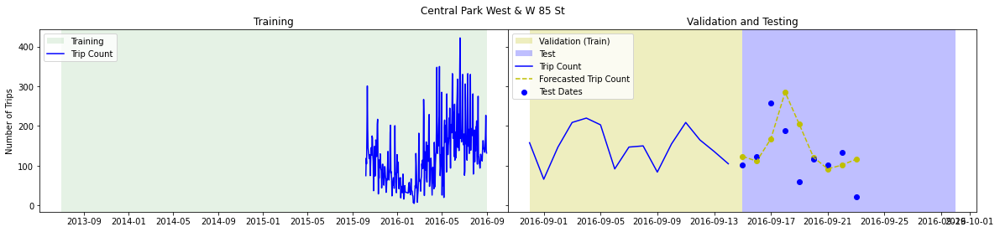

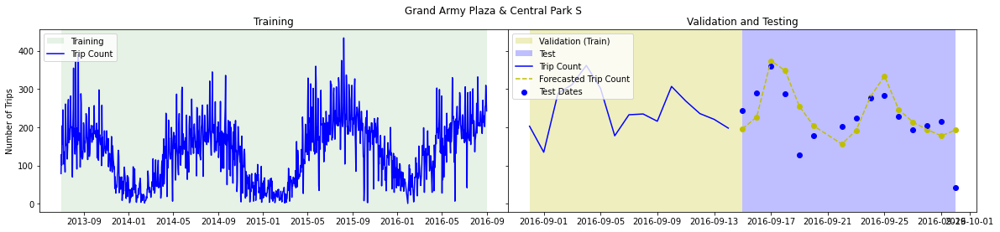

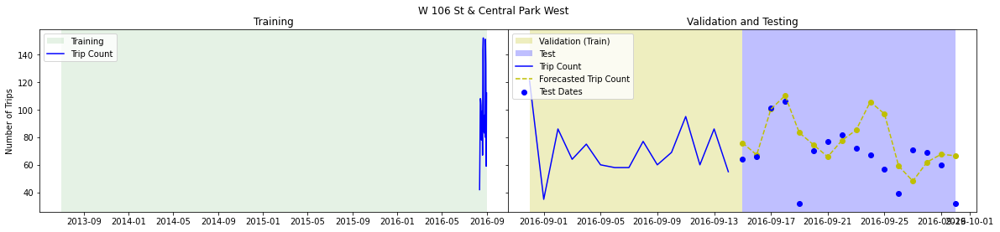

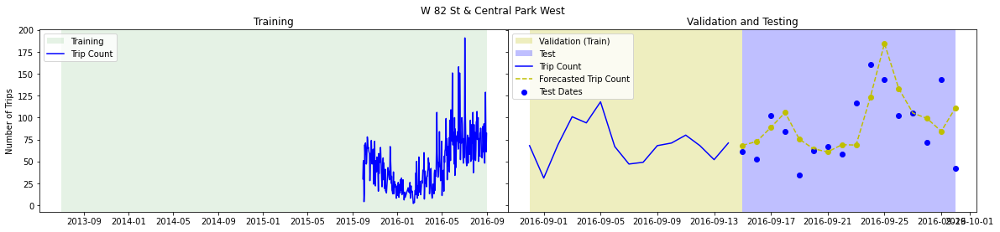

In [283]:
stations = rawSeries['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TRAIN')]
    valdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'VALIDATE')]
    testdf = rawSeries[(rawSeries['start_station_name'] == st) & (rawSeries['splits'] == 'TEST')]
    fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    #axes[1].plot(testdf['date'], testdf['num_trips'], color = 'b')
    
    axes[1].plot(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    axes[1].scatter(fit_testdf['date'], fit_testdf['predicted_num_trips'], color = 'y')
    
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [284]:
query = f"""
WITH
    RAW AS (
        SELECT DATE(date) as date, DATE(predicted_on_date) as predited_on_date, CAST(num_trips as INT64) AS num_trips, splits, start_station_name, predicted_num_trips.value as predicted_num_trips
        FROM `{PROJECT_ID}.{DATANAME}.automl5`
    ),
    LEAD AS (
        SELECT *, DATE_DIFF(date, predited_on_date, DAY) as prediction_lead_days
        FROM RAW
    ),
    LEFTSIDE AS (
        SELECT start_station_name, date, min(prediction_lead_days) as prediction_lead_days
        FROM LEAD
        GROUP BY start_station_name, date
    ),
    PREDS AS (
        SELECT *
        FROM LEFTSIDE
        LEFT OUTER JOIN LEAD
        USING (start_station_name, date, prediction_lead_days)   
    ),
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-predicted_num_trips)/num_trips) as percent
        FROM PREDS
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_autoML = bigquery.query(query = query).to_dataframe()
MAPE_autoML

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,61.642283,16,986.276531
1,Central Park S & 6 Ave,35.021344,16,560.341504
2,Central Park W & W 96 St,59.638679,16,954.218858
3,Central Park West & W 100 St,102.892802,16,1646.284835
4,Central Park West & W 102 St,48.141862,16,770.269800
5,Central Park West & W 68 St,37.307478,16,596.919645
6,Central Park West & W 72 St,42.050200,15,630.753003
7,Central Park West & W 76 St,32.624829,16,521.997261
8,Central Park West & W 85 St,91.459530,9,823.135773
9,Grand Army Plaza & Central Park S,41.756407,15,626.346102


In [285]:
MAPE_autoML['sums'].sum() / MAPE_autoML['n'].sum()

50.81489714781592

---
## Forecasting: Vertex AI AutoML Forecasting (API) - With Covariates

Currently this is just the data part extended from the BQML prepped data.

Next step is further prep, I suggest weather data (temp, state).  
Then AutoML with Python API

Finally, compare MAPE from TEST

In [44]:
# create data with splits here
query = f"""
CREATE OR REPLACE TABLE `{PROJECT_ID}.{DATANAME}.{DATANAME}_preppedCov` AS
WITH
    DAYS AS(
        SELECT
           start_station_name, usertype, gender,
           EXTRACT(DATE from starttime) AS date,
           COUNT(*) AS num_trips
        FROM `{BQ_SOURCE}`
        WHERE start_station_name LIKE '%Central Park%'
        GROUP BY start_station_name, usertype, gender, date
    )
SELECT *,
   CASE
       WHEN date < DATE({keyDates['val_start'][0].strftime('%Y, %m, %d')}) THEN "TRAIN"
       WHEN date < DATE({keyDates['test_start'][0].strftime('%Y, %m, %d')}) THEN "VALIDATE"
       ELSE "TEST"
   END AS splits
FROM DAYS
"""
job = bigquery.query(query = query)
job.result()
(job.ended-job.started).total_seconds()

2.119

In [45]:
# review counts by start_station_name and split
query = f"""
WITH ALLDATES AS(
    SELECT DISTINCT start_station_name, date, splits, sum(num_trips) as num_trips
    FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_preppedCov`
    GROUP BY start_station_name, date, splits
)
SELECT 
    start_station_name,
    COUNTIF(splits='TRAIN') as TRAIN,
    COUNTIF(splits='VALIDATE') as VALIDATE,
    COUNTIF(splits='TEST') as TEST,
    sum(num_trips) as totalTrips
FROM ALLDATES
GROUP BY start_station_name
ORDER BY start_station_name
"""
splitsCounts = bigquery.query(query = query).to_dataframe()

In [46]:
splitsCounts

,start_station_name,TRAIN,VALIDATE,TEST,totalTrips
0,Central Park North & Adam Clayton Powell Blvd,0,14,16,4808
1,Central Park S & 6 Ave,1146,15,16,172220
2,Central Park W & W 96 St,27,15,16,5905
3,Central Park West & W 100 St,23,15,16,2245
4,Central Park West & W 102 St,23,15,16,2851
5,Central Park West & W 68 St,328,15,16,35192
6,Central Park West & W 72 St,331,15,15,44574
7,Central Park West & W 76 St,324,15,16,27919
8,Central Park West & W 85 St,321,15,9,43895
9,Grand Army Plaza & Central Park S,1149,15,15,163815


In [47]:
splitsCounts[['TRAIN','TEST','VALIDATE']].sum()

TRAIN       4020
TEST         183
VALIDATE     179
dtype: int64

In [48]:
splitsCounts[['TRAIN','TEST','VALIDATE']].sum().sum()

4382

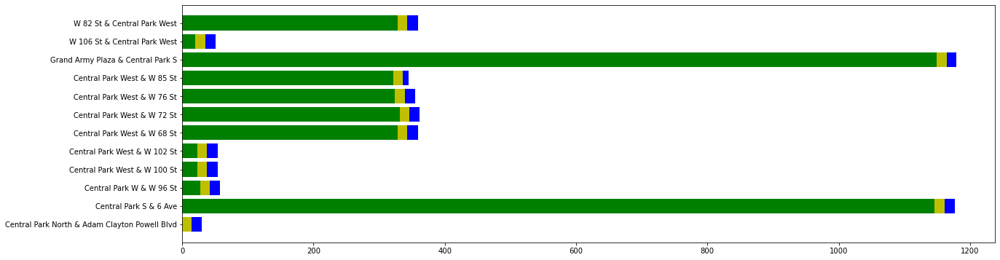

In [49]:
plt.figure(figsize=(20,6))
plt.barh(splitCounts['start_station_name'], splitCounts['TRAIN'], color = 'g')
plt.barh(splitCounts['start_station_name'], splitCounts['VALIDATE'], color = 'y', left = splitCounts['TRAIN'])
plt.barh(splitCounts['start_station_name'], splitCounts['TEST'], color = 'b', left = splitCounts['TRAIN']+splitCounts['VALIDATE'])
plt.show()

In [50]:
# review counts by start_station_name and split
query = f"""
SELECT 
    start_station_name, usertype, gender,
    COUNTIF(splits='TRAIN') as TRAIN,
    COUNTIF(splits='VALIDATE') as VALIDATE,
    COUNTIF(splits='TEST') as TEST,
    sum(num_trips) as totalTrips
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_preppedCov`
GROUP BY start_station_name, usertype, gender
ORDER by start_station_name
"""
covSplitCounts = bigquery.query(query = query).to_dataframe()

In [51]:
covSplitCounts[covSplitCounts['TRAIN']==0]

,start_station_name,usertype,gender,TRAIN,VALIDATE,TEST,totalTrips
0,Central Park North & Adam Clayton Powell Blvd,Customer,male,0,12,13,94
1,Central Park North & Adam Clayton Powell Blvd,Subscriber,male,0,14,16,1370
2,Central Park North & Adam Clayton Powell Blvd,Customer,female,0,12,12,85
3,Central Park North & Adam Clayton Powell Blvd,Subscriber,female,0,13,16,618
4,Central Park North & Adam Clayton Powell Blvd,Subscriber,unknown,0,8,11,29
5,Central Park North & Adam Clayton Powell Blvd,Customer,unknown,0,14,16,2612


In [52]:
covSplitCounts[covSplitCounts['TRAIN']==0]['totalTrips'].sum()

4808

In [53]:
splitCounts[splitCounts['TRAIN']==0]['totalTrips'][0]

4808

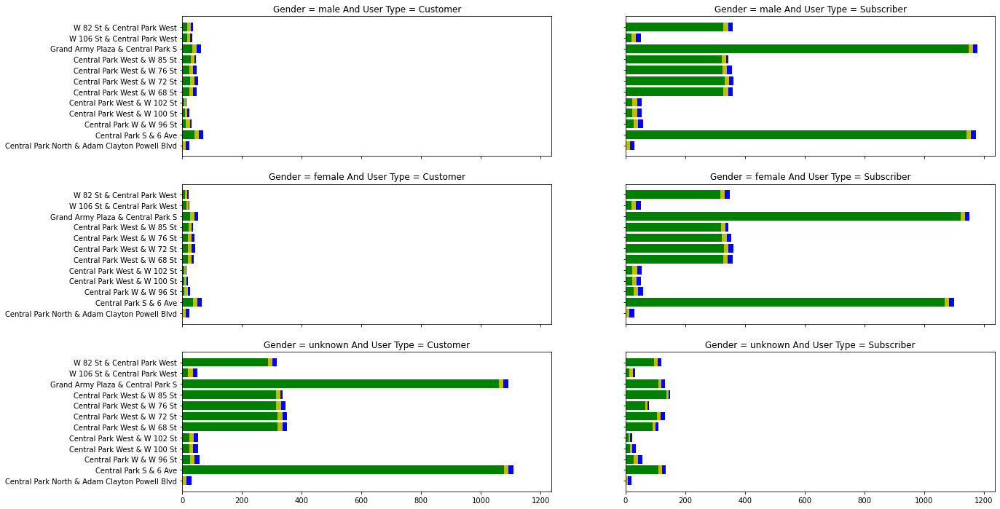

In [54]:
usertype = covSplitCounts['usertype'].unique().tolist()
gender = covSplitCounts['gender'].unique().tolist()

fig, axes = plt.subplots(len(gender), len(usertype), figsize=(20, 6*len(usertype)), sharex=True, sharey=True)
for u, ut in enumerate(usertype):
    for g, gt in enumerate(gender):
        tempdf = covSplitCounts[(covSplitCounts['usertype']==ut) & (covSplitCounts['gender']==gt)]
        axes[g,u].barh(tempdf['start_station_name'], tempdf['TRAIN'], color = 'g')
        axes[g,u].barh(tempdf['start_station_name'], tempdf['VALIDATE'], color = 'y', left = tempdf['TRAIN'])
        axes[g,u].barh(tempdf['start_station_name'], tempdf['TEST'], color = 'b', left = tempdf['TRAIN']+tempdf['VALIDATE'])
        axes[g,u].set_title("Gender = "+gt+" And User Type = "+ut)
plt.show()

---
## Forecasting: Custom Python with Prophet

In [188]:
!pip install pystan==2.19.1.1 -U -q
!pip install prophet -U -q
!pip install pandas-gbq -U -q

In [80]:
from prophet import Prophet

In [114]:
# data from BQ
query = f"""
SELECT *
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
ORDER by start_station_name, date
"""
source = bigquery.query(query = query).to_dataframe()
source.head()

,start_station_name,date,num_trips,splits
0,Central Park North & Adam Clayton Powell Blvd,2016-09-01,14,VALIDATE
1,Central Park North & Adam Clayton Powell Blvd,2016-09-02,151,VALIDATE
2,Central Park North & Adam Clayton Powell Blvd,2016-09-03,255,VALIDATE
3,Central Park North & Adam Clayton Powell Blvd,2016-09-04,328,VALIDATE
4,Central Park North & Adam Clayton Powell Blvd,2016-09-05,259,VALIDATE


In [120]:
seriesNames = source['start_station_name'].unique().tolist()
seriesFrames = []
for s in seriesNames:
    frame = source[(source['start_station_name']==s) & (source['splits']!='TEST')][['date','num_trips']].rename(columns={'date':'ds','num_trips':'y'})
    seriesFrames.append(frame)

In [145]:
seriesNames[5],seriesFrames[5]

('Central Park West & W 68 St',
               ds    y
 1373  2015-09-01   48
 1374  2015-09-02   75
 1375  2015-09-03   83
 1376  2015-09-04   74
 1377  2015-09-05  173
 ...          ...  ...
 1711  2016-09-10  203
 1712  2016-09-11  200
 1713  2016-09-12  160
 1714  2016-09-13  184
 1715  2016-09-14  121
 
 [343 rows x 2 columns])

In [146]:
# fit 1
p = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
p.add_country_holidays(country_name='US')
p.fit(seriesFrames[5])

Initial log joint probability = -8.66172


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       568.308   6.65757e-08       102.119       0.367       0.367      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       568.308   1.71768e-08       100.571       0.579       0.579      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [147]:
print(p.train_holiday_names)

0                  New Year's Day
1      Martin Luther King Jr. Day
2           Washington's Birthday
3                    Memorial Day
4                Independence Day
5                       Labor Day
6                    Columbus Day
7                    Veterans Day
8                    Thanksgiving
9                   Christmas Day
10       Christmas Day (Observed)
11    Independence Day (Observed)
dtype: object


In [148]:
# forecast
future = p.make_future_dataframe(periods = 16)
future

,ds
0,2015-09-01
1,2015-09-02
2,2015-09-03
3,2015-09-04
4,2015-09-05
...,...
354,2016-09-26
355,2016-09-27
356,2016-09-28
357,2016-09-29


In [149]:
forecast = p.predict(future)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-09-01,50.065197,47.306890,122.296795,50.065197,50.065197,0.0,0.0,0.0,0.0,...,-13.727619,-13.727619,-13.727619,39.829748,39.829748,39.829748,0.0,0.0,0.0,84.591030
1,2015-09-02,50.239476,56.345062,130.242643,50.239476,50.239476,0.0,0.0,0.0,0.0,...,-5.587668,-5.587668,-5.587668,40.945280,40.945280,40.945280,0.0,0.0,0.0,94.020792
2,2015-09-03,50.413756,55.775803,132.852838,50.413756,50.413756,0.0,0.0,0.0,0.0,...,-8.770515,-8.770515,-8.770515,42.003058,42.003058,42.003058,0.0,0.0,0.0,92.070003
3,2015-09-04,50.588036,54.210800,129.079526,50.588036,50.588036,0.0,0.0,0.0,0.0,...,-9.229046,-9.229046,-9.229046,42.981212,42.981212,42.981212,0.0,0.0,0.0,92.763905
4,2015-09-05,50.762316,80.882990,154.911215,50.762316,50.762316,0.0,0.0,0.0,0.0,...,15.570680,15.570680,15.570680,43.858338,43.858338,43.858338,0.0,0.0,0.0,118.615038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354,2016-09-26,118.208637,113.026787,184.780575,118.208637,118.208637,0.0,0.0,0.0,0.0,...,-7.101443,-7.101443,-7.101443,30.118666,30.118666,30.118666,0.0,0.0,0.0,149.649563
355,2016-09-27,118.382917,104.726582,179.107054,118.382917,118.382917,0.0,0.0,0.0,0.0,...,-13.727619,-13.727619,-13.727619,29.472099,29.472099,29.472099,0.0,0.0,0.0,142.551100
356,2016-09-28,118.557197,114.829187,188.389884,118.557196,118.557197,0.0,0.0,0.0,0.0,...,-5.587668,-5.587668,-5.587668,29.038876,29.038876,29.038876,0.0,0.0,0.0,150.432108
357,2016-09-29,118.731476,109.451863,184.469192,118.731476,118.731477,0.0,0.0,0.0,0.0,...,-8.770515,-8.770515,-8.770515,28.836784,28.836784,28.836784,0.0,0.0,0.0,147.221449


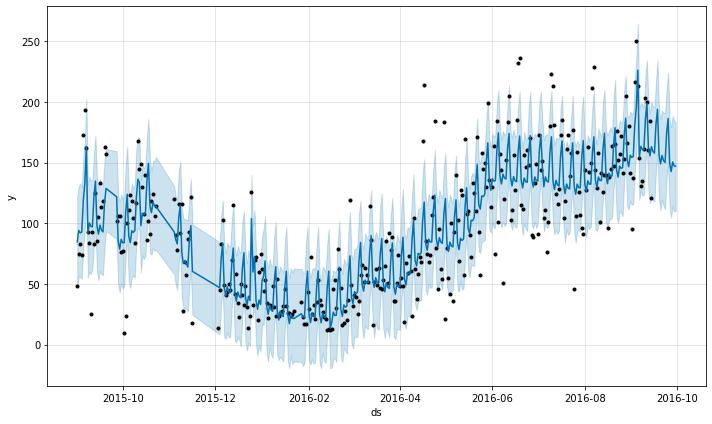

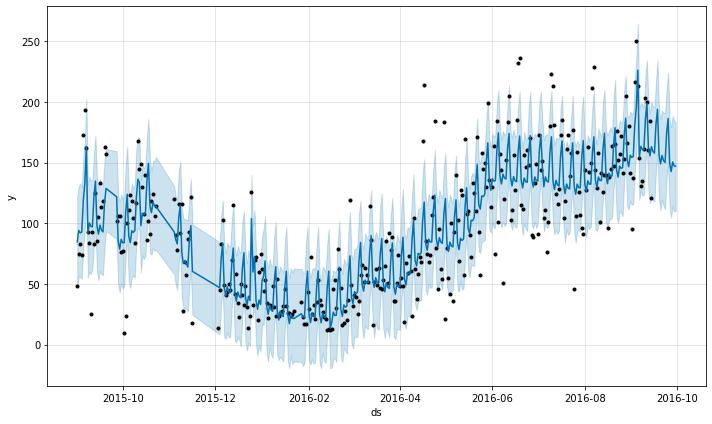

In [150]:
p.plot(forecast)

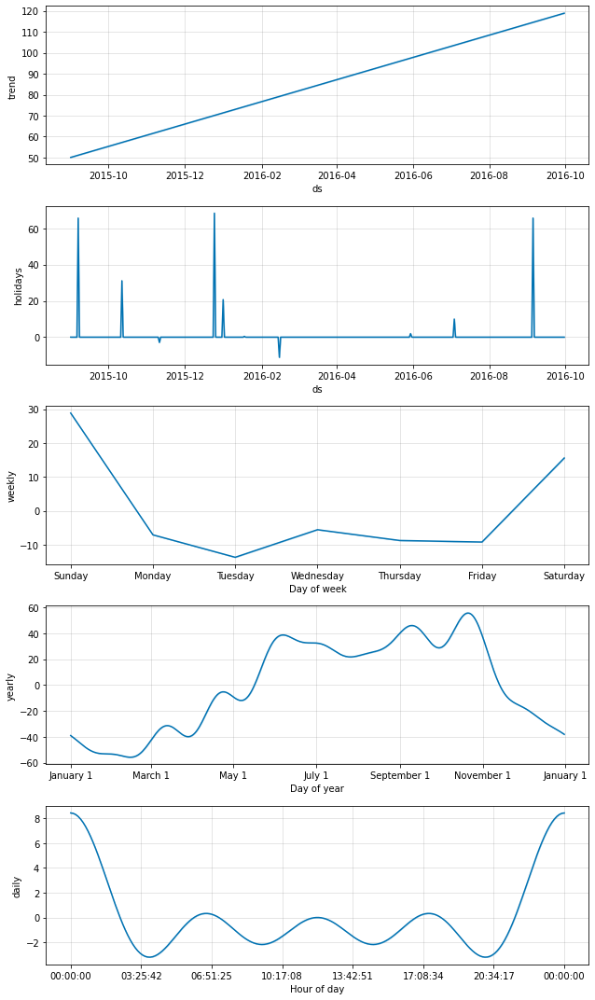

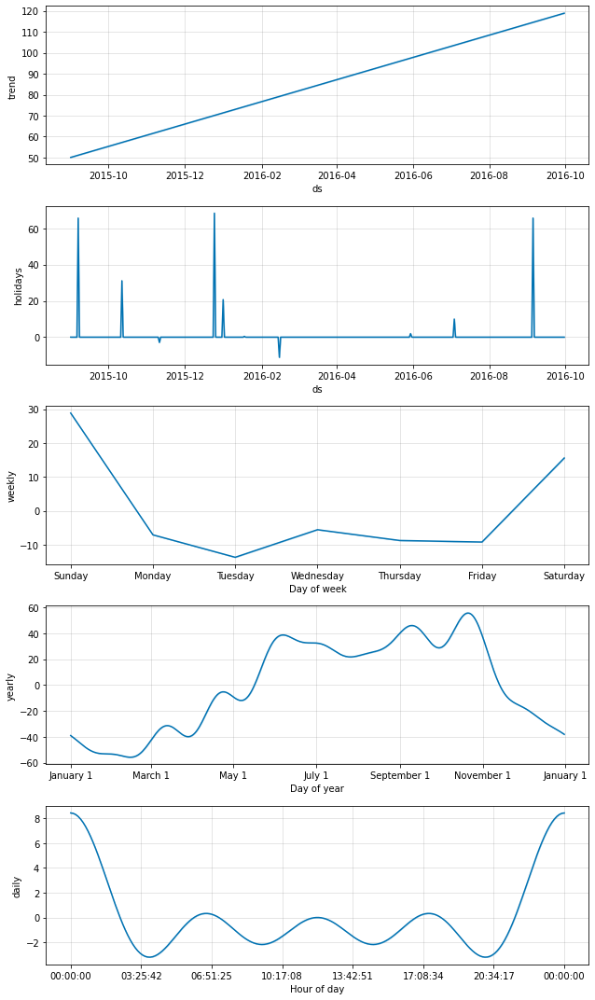

In [151]:
p.plot_components(forecast)

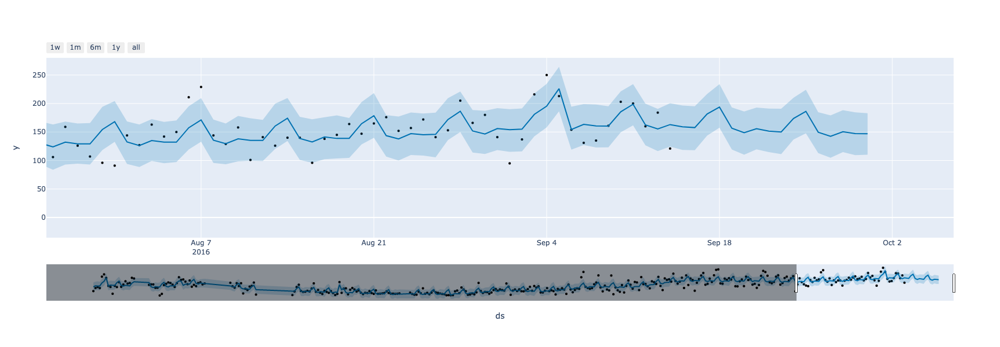

In [152]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(p, forecast)

/opt/conda/lib/python3.7/site-packages/plotly/io/_json.py:469: UserWarning:

Discarding nonzero nanoseconds in conversion



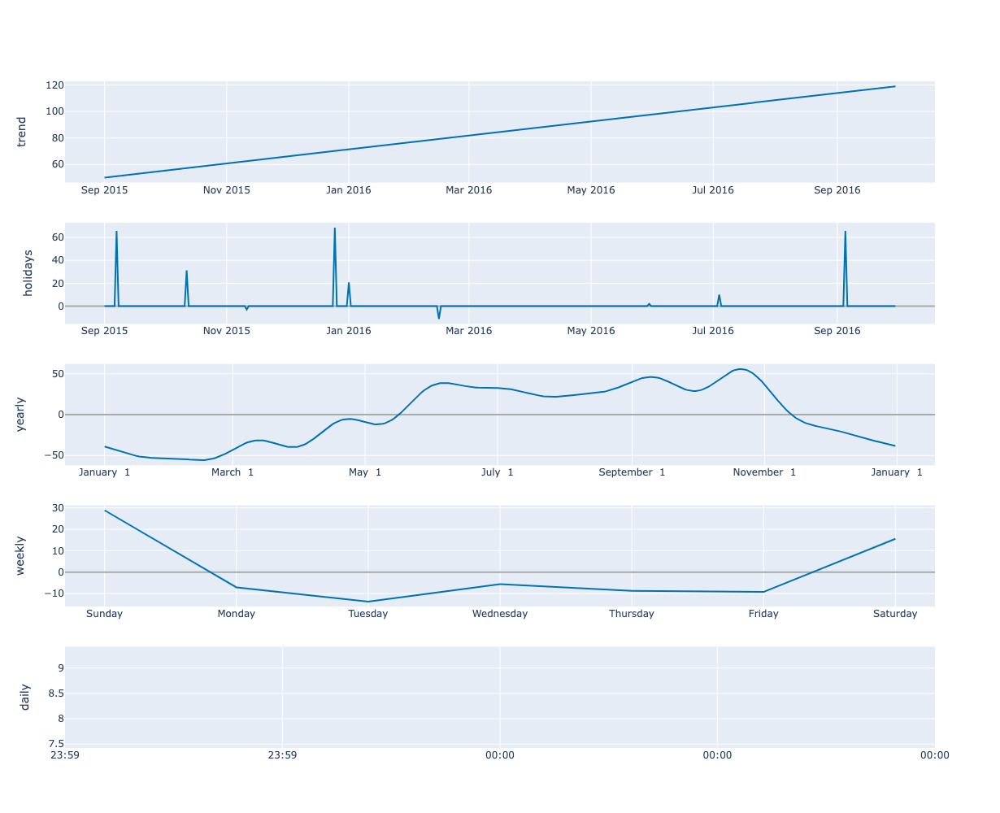

In [153]:
plot_components_plotly(p, forecast)

In [ ]:
# fit all - save forecast

In [244]:
def run_prophet(series):
    p = Prophet(weekly_seasonality=True)#yearly_seasonality=True, daily_seasonality=True,)
    p.add_country_holidays(country_name='US')
    p.fit(series)
    f = p.make_future_dataframe(periods = 16)
    f = p.predict(f)
    return f[['ds','yhat','yhat_lower','yhat_upper']]

In [245]:
test = run_prophet(seriesFrames[5])
test

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
Initial log joint probability = -8.66172
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        501.52    0.00098497        59.384           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       502.035   0.000369393       69.1758      0.2906           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       502.164    0.00044162       80.8457   4.794e-06       0.001      377  LS failed, Hessian reset 
     299       502.185   1.66096e-06       69.6783       0.739       0.739      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       50

,ds,yhat,yhat_lower,yhat_upper
0,2015-09-01,93.321899,50.015759,132.697669
1,2015-09-02,101.207885,64.918608,141.237000
2,2015-09-03,97.696103,57.406578,141.368155
3,2015-09-04,96.595153,59.318270,135.535249
4,2015-09-05,120.751673,77.922091,158.269178
...,...,...,...,...
354,2016-09-26,176.328550,136.797462,220.159639
355,2016-09-27,171.313071,133.177454,211.009520
356,2016-09-28,180.287019,142.141021,221.937938
357,2016-09-29,177.863199,137.469930,219.138058


In [246]:
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

In [247]:
cpu_count()

4

In [248]:
pool = Pool(cpu_count())
predictions = list(tqdm(pool.imap(run_prophet, seriesFrames), total = len(seriesFrames)))
pool.close()
pool.join()

  0%|          | 0/12 [00:00<?, ?it/s]

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.


Initial log joint probability = -52.9409
Initial log joint probability = -40.864
Iteration  1. Log joint probability =   0.526845. Improved by 53.4677.
Iteration  2. Log joint probability =    2.01758. Improved by 1.4

  8%|▊         | 1/12 [00:05<00:55,  5.09s/it]

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.

Initial log joint probability = -40.5909
Iteration  1. Log joint probability =    26.2809. Improved by 66.8718.
Iteration  2. Log joint probability =    41.4942. Improved by 15.2133.
Iteration  3. Log joint probability =     52.473. Improved by 10.9787.
Iteration  4. Log joint probability =    54.3205. Improved by 1.84757.
Iteration  5. Log joint probability =    54.8009. Improved by 0.480391.
Iteration  6. Log joint probability =    55.0825. Improved by 0.281544.
Iteration  7. Log joint probability =    55.0881. Improved by 0.00559737.
Initial log joint probability = -8.66172
    Iter   

 17%|█▋        | 2/12 [00:11<00:55,  5.57s/it]

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


 50%|█████     | 6/12 [00:11<00:07,  1.30s/it]

Initial log joint probability = -9.46235
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       520.663    0.00298032       120.658    2.63e-05       0.001      154  LS failed, Hessian reset 
      99       521.736    0.00148745       60.2842           1           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       521.852   9.29306e-06       56.6807   1.369e-07       0.001      275  LS failed, Hessian reset 
     172       521.853   1.94637e-07       62.6934   2.814e-09       0.001      333  LS failed, Hessian reset 
     182       521.853   9.21234e-08       50.5183   1.274e-09       0.001      379  LS failed, Hessian reset 
     188       521.853   6.95073e-09       62.9751      0.2031           1      388   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -8.0478
    Iter    

 67%|██████▋   | 8/12 [00:14<00:06,  1.50s/it]

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


 75%|███████▌  | 9/12 [00:15<00:03,  1.25s/it]

Initial log joint probability = -5.15981
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       577.223    0.00167187       109.914    2.11e-05       0.001      116  LS failed, Hessian reset 
      99       577.969   0.000283063       61.4906      0.3301      0.3301      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       578.125   0.000340861       73.3439   5.241e-06       0.001      228  LS failed, Hessian reset 
     173       578.211   2.64883e-05       61.0748   3.561e-07       0.001      320  LS failed, Hessian reset 
     199       578.237   0.000519481       56.3772      0.7566      0.7566      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       578.243    2.7401e-06       65.8402   3.111e-08       0.001      427  LS failed, Hessian reset 
     245       578.243   1.57361e-08       56.7051       0.497   

100%|██████████| 12/12 [00:18<00:00,  1.57s/it]


In [249]:
predictions[0]

,ds,yhat,yhat_lower,yhat_upper
0,2016-09-01,77.981838,33.839004,120.605296
1,2016-09-02,139.988952,93.936291,181.276988
2,2016-09-03,220.489021,173.341632,264.364027
3,2016-09-04,274.491658,225.941929,317.070696
4,2016-09-05,258.862315,209.446044,302.618151
5,2016-09-06,123.520849,79.390218,172.119863
6,2016-09-07,124.041599,78.762659,169.982489
7,2016-09-08,77.978107,29.384260,125.003752
8,2016-09-09,139.985221,95.579903,188.423127
9,2016-09-10,220.485290,173.739705,263.019738


In [250]:
# data to BQ
for i, p in enumerate(predictions):
    p['start_station_name'] = seriesNames[i]
    
output = pd.concat(predictions)
output

,ds,yhat,yhat_lower,yhat_upper,start_station_name
0,2016-09-01,77.981838,33.839004,120.605296,Central Park North & Adam Clayton Powell Blvd
1,2016-09-02,139.988952,93.936291,181.276988,Central Park North & Adam Clayton Powell Blvd
2,2016-09-03,220.489021,173.341632,264.364027,Central Park North & Adam Clayton Powell Blvd
3,2016-09-04,274.491658,225.941929,317.070696,Central Park North & Adam Clayton Powell Blvd
4,2016-09-05,258.862315,209.446044,302.618151,Central Park North & Adam Clayton Powell Blvd
...,...,...,...,...,...
354,2016-09-26,76.678990,52.826597,102.555764,W 82 St & Central Park West
355,2016-09-27,76.062342,50.087057,100.590401,W 82 St & Central Park West
356,2016-09-28,79.895369,57.506853,104.369635,W 82 St & Central Park West
357,2016-09-29,77.252782,53.920714,102.365703,W 82 St & Central Park West


EL Process
https://cloud.google.com/bigquery/docs/pandas-gbq-migration#loading_a_pandas_dataframe_to_a_table

In [251]:
output.to_gbq(f"{DATANAME}.{DATANAME}_prophet", PROJECT_ID, if_exists = 'replace')

  0%|          | 0/1 [00:00<?, ?it/s]

4391 out of 4391 rows loaded.


100%|██████████| 1/1 [00:00<00:00, 800.59it/s]


T process

In [252]:
# data from BQ
query = f"""
CREATE OR REPLACE TABLE `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet` AS
WITH
    SOURCE AS (
        SELECT *
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
    ),
    PROPHET AS (
        SELECT start_station_name, DATE(ds) as date, yhat, yhat_lower, yhat_upper
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
    )
SELECT *
FROM SOURCE
LEFT OUTER JOIN PROPHET
USING (start_station_name, date)
ORDER by start_station_name, date
"""
Tjob = bigquery.query(query = query)
Tjob.result()
(Tjob.ended-Tjob.started).total_seconds()

1.936

In [253]:
# data from BQ
query = f"""
SELECT *
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
ORDER by start_station_name, date
"""
prophet = bigquery.query(query = query).to_dataframe()

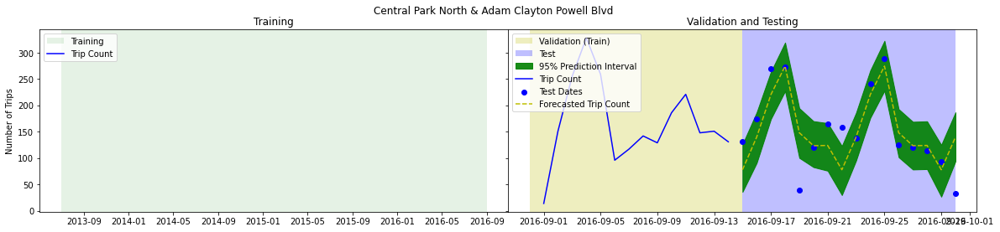

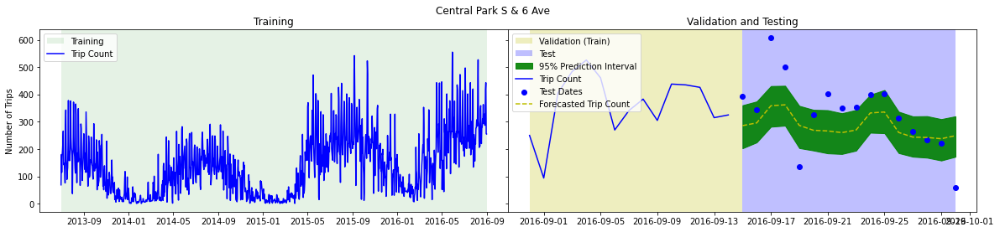

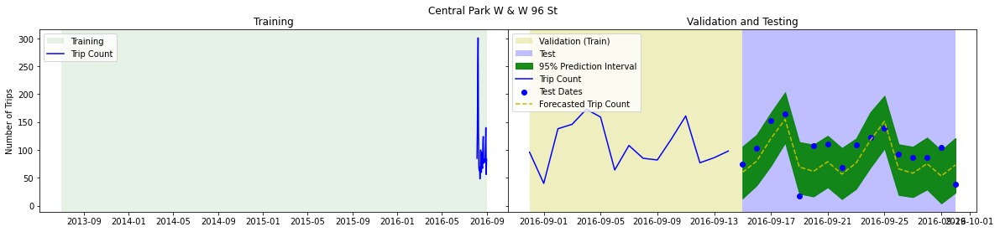

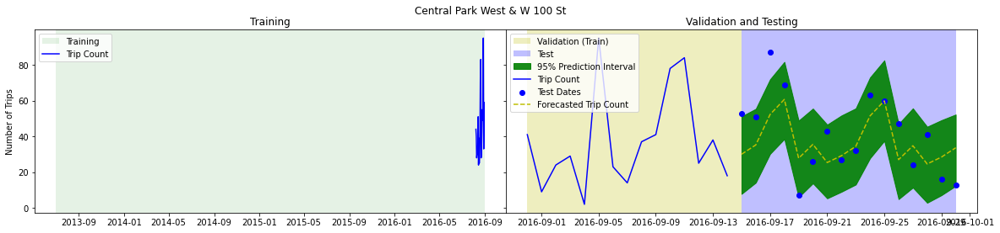

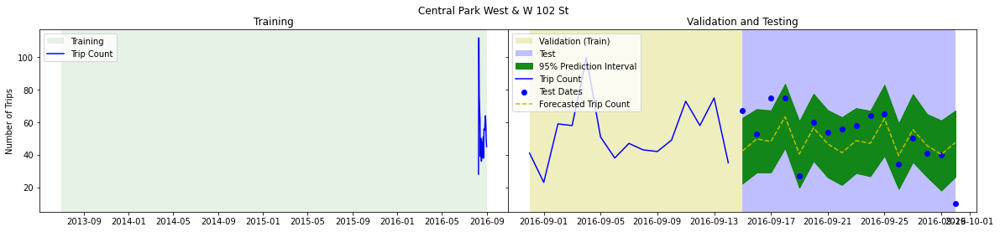

...

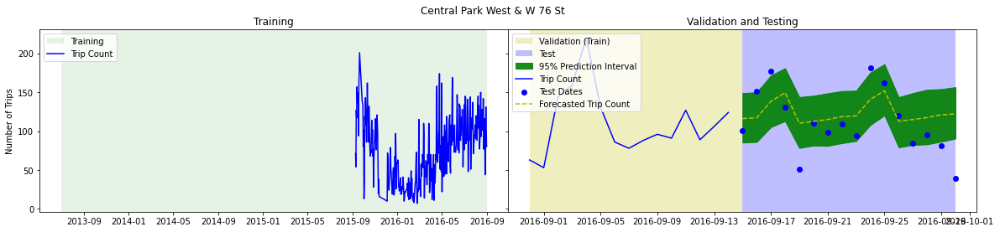

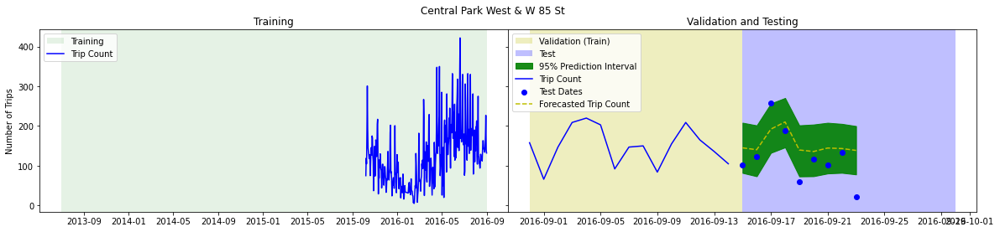

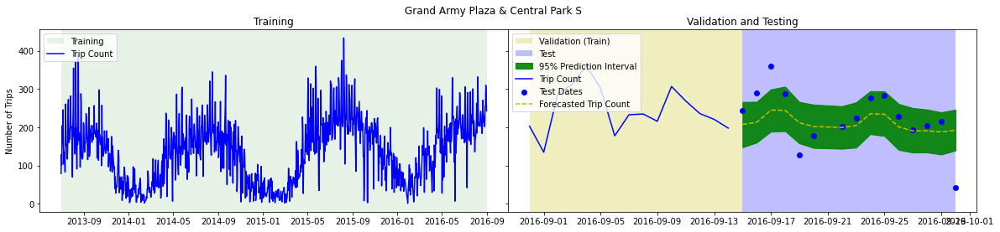

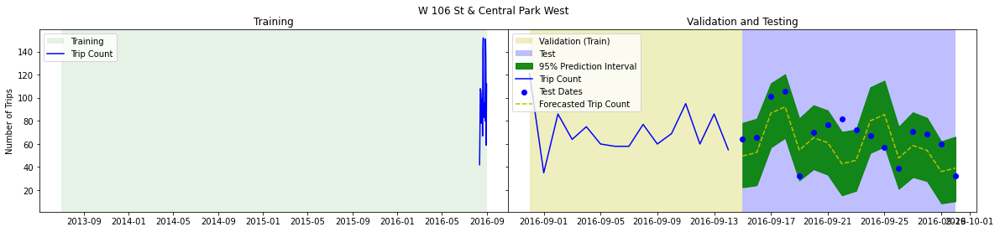

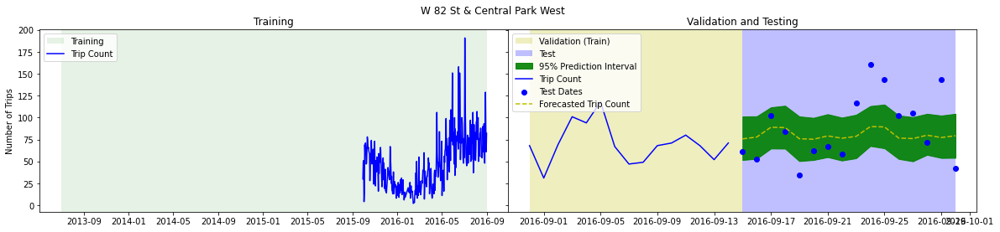

In [254]:
stations = prophet['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'TRAIN')]
    valdf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'VALIDATE')]
    testdf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'TEST')]
    #fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    axes[1].fill_between(testdf['date'], testdf['yhat_lower'], testdf['yhat_upper'], color = 'g', alpha = 0.9, label = '95% Prediction Interval')
    
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    axes[1].plot(testdf['date'], testdf['yhat'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    #axes[1].scatter(testdf['date'], testdf['yhat'], color = 'y')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [255]:
query = f"""
WITH
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-yhat)/num_trips) as percent
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_prophet = bigquery.query(query = query).to_dataframe()
MAPE_prophet

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,49.083533,30,1472.505977
1,Central Park S & 6 Ave,130.790178,1177,153940.039488
2,Central Park W & W 96 St,30.121048,58,1747.020778
3,Central Park West & W 100 St,95.217038,54,5141.720053
4,Central Park West & W 102 St,29.543495,54,1595.348723
5,Central Park West & W 68 St,42.868103,359,15389.649007
6,Central Park West & W 72 St,56.276449,361,20315.798125
7,Central Park West & W 76 St,43.403420,355,15408.214237
8,Central Park West & W 85 St,56.226677,345,19398.203475
9,Grand Army Plaza & Central Park S,77.549382,1179,91430.721051


In [256]:
MAPE_prophet['sums'].sum() / MAPE_prophet['n'].sum()

78.73751914504979

---
## Forecasting: Custom Container with Prophet

https://cloud.google.com/vertex-ai/docs/training/create-custom-container

In [399]:
BASE_IMAGE = 'gcr.io/deeplearning-platform-release/base-cpu'
TRAIN_COMPUTE = 'n1-standard-8'

In [400]:
TIMESTAMP = datetime.now().strftime("%Y%m%d%H%M%S")
BUCKET = PROJECT_ID
URI = f"gs://{BUCKET}/{DATANAME}/models/{NOTEBOOK}"
DIR = f"temp/{NOTEBOOK}"

In [401]:
# Give service account roles/storage.objectAdmin permissions
# Console > IMA > Select Account <projectnumber>-compute@developer.gserviceaccount.com > edit - give role
SERVICE_ACCOUNT = !gcloud config list --format='value(core.account)' 
SERVICE_ACCOUNT = SERVICE_ACCOUNT[0]
SERVICE_ACCOUNT

'715288179162-compute@developer.gserviceaccount.com'

In [402]:
!rm -rf {DIR}
!mkdir -p {DIR}

- pre-built containers:https://cloud.google.com/vertex-ai/docs/training/pre-built-containers#available_container_images
- deeplearning container images: https://cloud.google.com/deep-learning-containers/docs/choosing-container

In [403]:
!mkdir -p {DIR}/model/fit

In [421]:
%%writefile  {DIR}/model/fit/prophet.py
from prophet import Prophet
from google.cloud import bigquery
import pandas as pd
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import argparse

# import parameters
parser = argparse.ArgumentParser()
parser.add_argument('--PROJECT_ID', dest = 'PROJECT_ID', type = str)
parser.add_argument('--DATANAME', dest = 'DATANAME', type = str)
args = parser.parse_args()
PROJECT_ID = args.PROJECT_ID
DATANAME = args.DATANAME
print(PROJECT_ID, DATANAME)

# client for BQ
bigquery = bigquery.Client(project = PROJECT_ID)

# input data - from BQ
query = f"SELECT * FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped` ORDER by start_station_name, date"
source = bigquery.query(query = query).to_dataframe()

# preprocess data - as a list of dataframes for each series
seriesNames = source['start_station_name'].unique().tolist()
seriesFrames = []
for s in seriesNames:
    frame = source[(source['start_station_name']==s) & (source['splits']!='TEST')][['date','num_trips']].rename(columns={'date':'ds','num_trips':'y'})
    seriesFrames.append(frame)

# function to run a prophet fit & forecast
def run_prophet(series):
    p = Prophet(weekly_seasonality=True)
    p.add_country_holidays(country_name='US')
    p.fit(series)
    f = p.make_future_dataframe(periods = 16)
    f = p.predict(f)
    return f[['ds','yhat','yhat_lower','yhat_upper']]

# run the series in a thread pool for multiprocessing
pool = Pool(cpu_count())
predictions = list(tqdm(pool.imap(run_prophet, seriesFrames), total = len(seriesFrames)))
pool.close()
pool.join()

# postprocess data - add series name back to dataframe and concatenate all into one dataframe
for i, p in enumerate(predictions):
    p['start_station_name'] = seriesNames[i]
output = pd.concat(predictions)

# output data - to BQ
output.to_gbq(f"{DATANAME}.{DATANAME}_prophet", PROJECT_ID, if_exists = 'replace')

# Transform final data in BQ - merge with original input
query = f"""
CREATE OR REPLACE TABLE `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet` AS
WITH
    SOURCE AS (
        SELECT *
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prepped`
    ),
    PROPHET AS (
        SELECT start_station_name, DATE(ds) as date, yhat, yhat_lower, yhat_upper
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
    )
SELECT *
FROM SOURCE
LEFT OUTER JOIN PROPHET
USING (start_station_name, date)
ORDER by start_station_name, date
"""
Tjob = bigquery.query(query = query)
Tjob.result()
(Tjob.ended-Tjob.started).total_seconds()

Overwriting temp/f-01a/model/fit/prophet.py


In [422]:
dockerfile = f"""
FROM {BASE_IMAGE}
WORKDIR /
RUN pip install pandas pystan==2.19.1.1 prophet pandas-gbq google-cloud-bigquery pyarrow tqdm
## Copies the trainer code to the docker image
COPY fit /fit
## Sets up the entry point to invoke the trainer
ENTRYPOINT ["python", "-m", "fit.prophet"]
#ENTRYPOINT ["python", "fit/prophet.py"]
"""
with open(f'{DIR}/model/Dockerfile', 'w') as f:
    f.write(dockerfile)

https://cloud.google.com/artifact-registry/docs/docker/store-docker-container-images#before-you-begin

In [325]:
!gcloud services enable artifactregistry.googleapis.com

In [326]:
!gcloud artifacts repositories create {PROJECT_ID} --repository-format=docker \
--location={REGION} --description="Docker Repository for {PROJECT_ID}"

ERROR: (gcloud.artifacts.repositories.create) ALREADY_EXISTS: the repository already exists


In [327]:
!gcloud artifacts repositories list

Listing items under project statmike-demo3, across all locations.

                                                               ARTIFACT_REGISTRY
REPOSITORY      FORMAT  DESCRIPTION                            LOCATION     LABELS  ENCRYPTION          CREATE_TIME          UPDATE_TIME
statmike-demo3  DOCKER  fDocker Repository for statmike-demo3  us-central1          Google-managed key  2022-03-09T12:54:13  2022-03-09T12:54:13


In [302]:
!gcloud auth configure-docker {REGION}-docker.pkg.dev --quiet


{
  "credHelpers": {
    "gcr.io": "gcloud",
    "us.gcr.io": "gcloud",
    "eu.gcr.io": "gcloud",
    "asia.gcr.io": "gcloud",
    "staging-k8s.gcr.io": "gcloud",
    "marketplace.gcr.io": "gcloud"
  }
}
Adding credentials for: us-central1-docker.pkg.dev
Docker configuration file updated.


In [392]:
IMAGE_URI=f"{REGION}-docker.pkg.dev/{PROJECT_ID}/{PROJECT_ID}/prophet:latest"

In [393]:
IMAGE_URI

'us-central1-docker.pkg.dev/statmike-demo3/statmike-demo3/prophet:latest'

In [423]:
# buid the image with the tag
!docker build {DIR}/model/. -t $IMAGE_URI

Sending build context to Docker daemon  5.632kB
Step 1/5 : FROM gcr.io/deeplearning-platform-release/base-cpu
 ---> bc8479139130
Step 2/5 : WORKDIR /
 ---> Using cache
 ---> e044b6f855ab
Step 3/5 : RUN pip install pandas pystan==2.19.1.1 prophet pandas-gbq google-cloud-bigquery pyarrow tqdm
 ---> Using cache
 ---> 0f84b7c3af82
Step 4/5 : COPY fit /fit
 ---> 95f90ce5f5b0
Step 5/5 : ENTRYPOINT ["python", "-m", "fit.prophet"]
 ---> Running in 0df5c4a28c1d
Removing intermediate container 0df5c4a28c1d
 ---> 1c4384ec80eb
Successfully built 1c4384ec80eb
Successfully tagged us-central1-docker.pkg.dev/statmike-demo3/statmike-demo3/prophet:latest


In [424]:
!docker run {IMAGE_URI} --PROJECT_ID {PROJECT_ID} --DATANAME {DATANAME}

Importing plotly failed. Interactive plots will not work.
statmike-demo3 citibikes
  0%|          | 0/12 [00:00<?, ?it/s]INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.

Initial log joint probability = -43.6939

Initial log joint probability = -52.9409

Initial log j

In [425]:
!docker ps -a

CONTAINER ID   IMAGE                                                                     COMMAND                  CREATED             STATUS                              PORTS     NAMES
0c6ec486aca5   us-central1-docker.pkg.dev/statmike-demo3/statmike-demo3/prophet:latest   "python -m fit.proph…"   37 seconds ago      Exited (0) Less than a second ago             silly_poitras
401f57bfb89e   64d210f71021                                                              "python -m fit.proph…"   21 minutes ago      Exited (0) 20 minutes ago                     romantic_jang
df0cb425f0a6   c2080bdb4f60                                                              "python fit/prophet.…"   22 minutes ago      Exited (1) 22 minutes ago                     goofy_elgamal
534f2e29f170   fe4078db516c                                                              "python fit/prophet.…"   23 minutes ago      Exited (1) 23 minutes ago                     jovial_faraday
ffde2d1a197d   53c5f5951d86          

In [426]:
!docker push $IMAGE_URI

The push refers to repository [us-central1-docker.pkg.dev/statmike-demo3/statmike-demo3/prophet]

41985653: Preparing 
407f67d9: Preparing 
c3dd1b30: Preparing 
f55e5b0f: Preparing 
b8042115: Preparing 
e7ceaeea: Preparing 
659ee3aa: Preparing 
153ced2f: Preparing 
b90e8bce: Preparing 
d686dc1d: Preparing 
c56dcfc0: Preparing 
dd09476c: Preparing 
384be1ed: Preparing 
0864cc76: Preparing 
24e4876e: Preparing 
bf18a086: Preparing 
282950fe: Preparing 
0b19050d: Preparing 
b453bec5: Preparing 
1985653: Pushed lready exists 7kBlatest: digest: sha256:6a92923644a5835713a5b348e68f593ce03175ef374693a06e70ed6eb1ad3d0f size: 4501


- https://googleapis.dev/python/aiplatform/latest/aiplatform.html#google.cloud.aiplatform.CustomJob
- https://cloud.google.com/vertex-ai/docs/training/create-custom-job

In [434]:
CMDARGS = [
    "--PROJECT_ID=" + PROJECT_ID,
    "--DATANAME=" + DATANAME
]

MACHINE_SPEC = {
    "machine_type": TRAIN_COMPUTE,
    "accelerator_count": 0
}

WORKER_POOL_SPEC = [
    {
        "replica_count": 1,
        "machine_spec": MACHINE_SPEC,
        "container_spec": {
            "image_uri": IMAGE_URI,
            "command": [],
            "args": CMDARGS
        }
    }
]

In [435]:
customJob = aiplatform.CustomJob(
    display_name = f'{NOTEBOOK}_{DATANAME}_{TIMESTAMP}',
    worker_pool_specs = WORKER_POOL_SPEC,
    base_output_dir = f"{URI}/{TIMESTAMP}",
    staging_bucket = f"{URI}/{TIMESTAMP}",
    labels = {'notebook':f'{NOTEBOOK}'}
)

In [436]:
customJob.run(
    service_account = SERVICE_ACCOUNT,
    sync = False
)

INFO:google.cloud.aiplatform.jobs:Creating CustomJob
INFO:google.cloud.aiplatform.jobs:CustomJob created. Resource name: projects/715288179162/locations/us-central1/customJobs/4666396617513893888
INFO:google.cloud.aiplatform.jobs:To use this CustomJob in another session:
INFO:google.cloud.aiplatform.jobs:custom_job = aiplatform.CustomJob.get('projects/715288179162/locations/us-central1/customJobs/4666396617513893888')
INFO:google.cloud.aiplatform.jobs:View Custom Job:
https://console.cloud.google.com/ai/platform/locations/us-central1/training/4666396617513893888?project=715288179162
INFO:google.cloud.aiplatform.jobs:CustomJob projects/715288179162/locations/us-central1/customJobs/4666396617513893888 current state:
JobState.JOB_STATE_PENDING
INFO:google.cloud.aiplatform.jobs:CustomJob projects/715288179162/locations/us-central1/customJobs/4666396617513893888 current state:
JobState.JOB_STATE_PENDING
INFO:google.cloud.aiplatform.jobs:CustomJob projects/715288179162/locations/us-central1/

In [437]:
# data from BQ
query = f"""
SELECT *
FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
ORDER by start_station_name, date
"""
prophet = bigquery.query(query = query).to_dataframe()

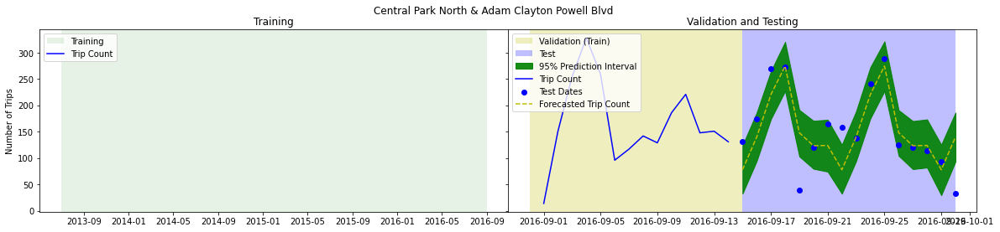

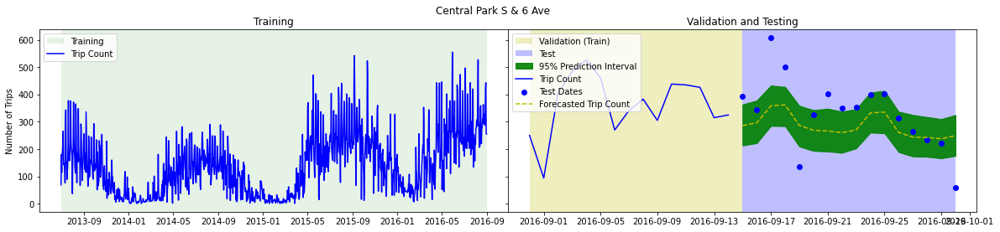

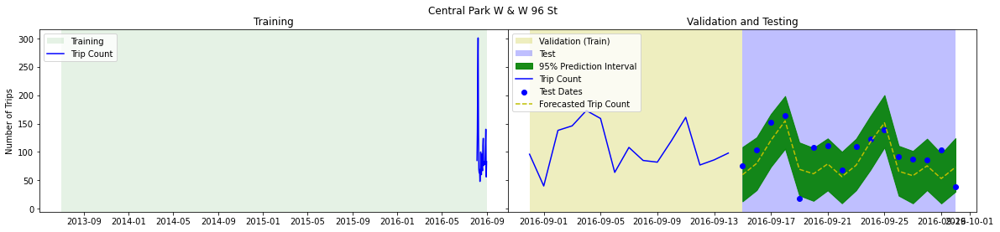

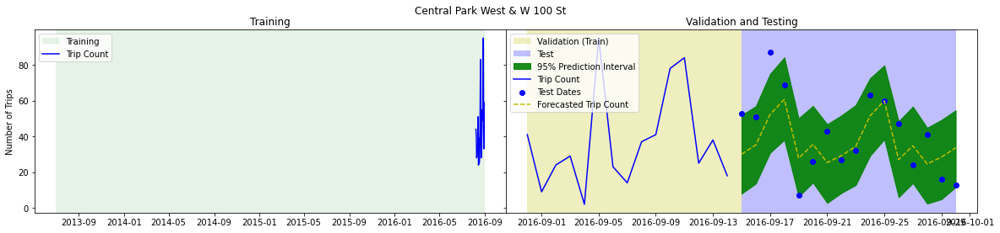

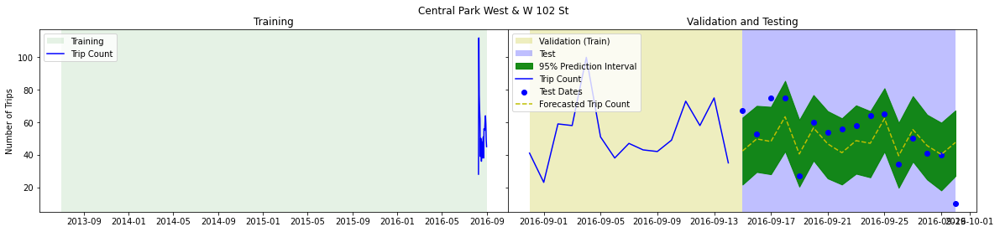

...

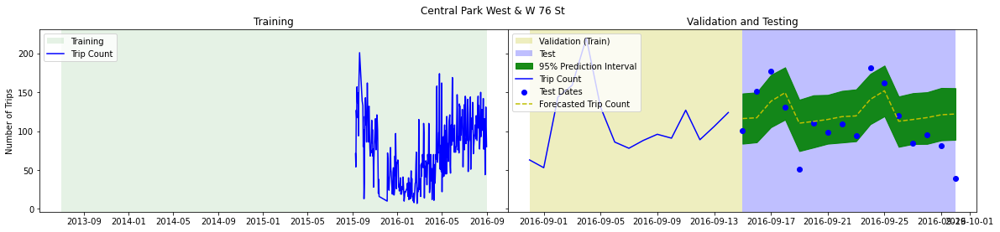

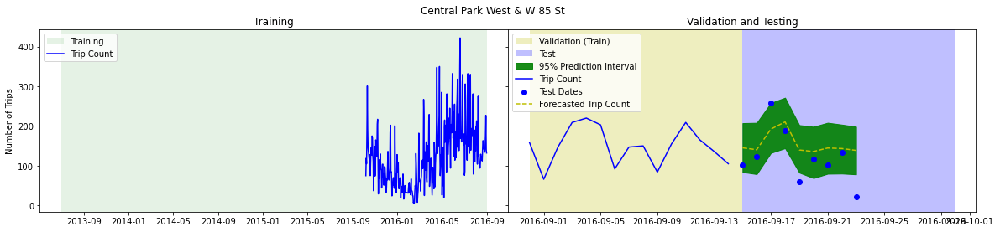

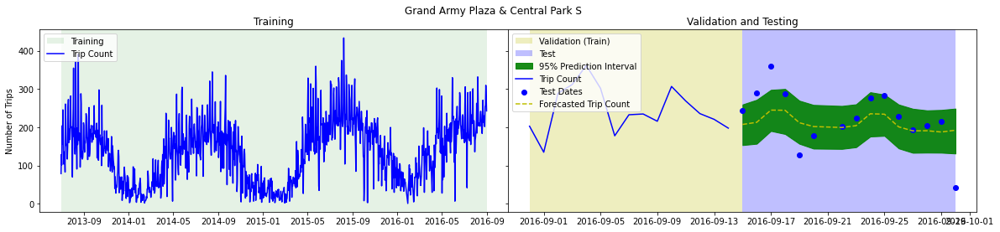

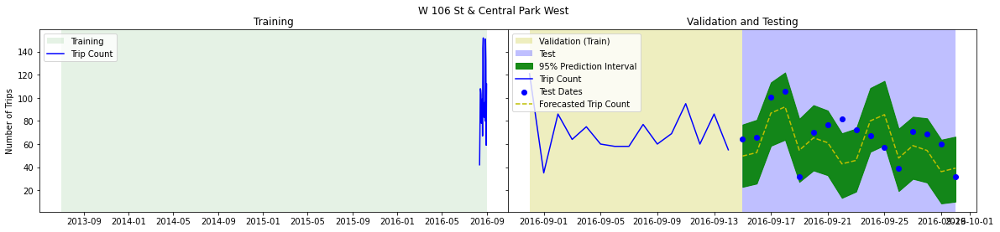

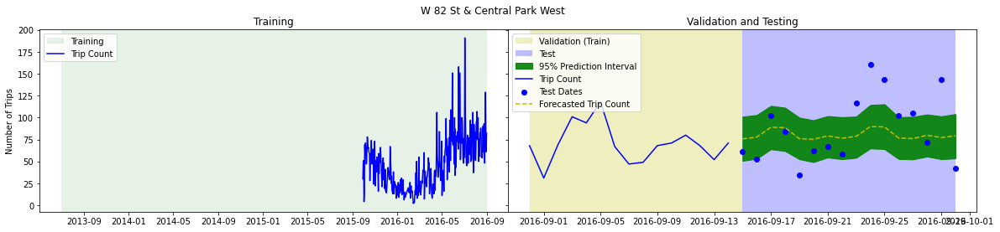

In [438]:
stations = prophet['start_station_name'].unique().tolist()
for s, st in enumerate(stations):
    # setup plot area
    fig, axes = plt.subplots(1, 2, figsize=(20, 4), sharex=False, sharey=True)
    fig.subplots_adjust(wspace=0)
    
    # data
    traindf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'TRAIN')]
    valdf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'VALIDATE')]
    testdf = prophet[(prophet['start_station_name'] == st) & (prophet['splits'] == 'TEST')]
    #fit_testdf = autoML[(autoML['start_station_name'] == st) & (autoML['splits'] == 'TEST')]
    
    # regions
    axes[0].axvspan(keyDates['start_date'][0], keyDates['val_start'][0], facecolor='g', alpha = 0.1, label = 'Training')
    axes[1].axvspan(keyDates['val_start'][0], keyDates['test_start'][0], facecolor='y', alpha = 0.25, label = 'Validation (Train)')
    axes[1].axvspan(keyDates['test_start'][0], keyDates['end_date'][0], facecolor='b', alpha = 0.25, label = 'Test')
    axes[1].fill_between(testdf['date'], testdf['yhat_lower'], testdf['yhat_upper'], color = 'g', alpha = 0.9, label = '95% Prediction Interval')
    
    
    # lines and dots
    axes[0].plot(traindf['date'], traindf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].plot(valdf['date'], valdf['num_trips'], color = 'b', label = 'Trip Count')
    axes[1].scatter(testdf['date'], testdf['num_trips'], color = 'b', label = 'Test Dates')
    
    axes[1].plot(testdf['date'], testdf['yhat'], color = 'y', label = 'Forecasted Trip Count', linestyle='dashed')
    #axes[1].scatter(testdf['date'], testdf['yhat'], color = 'y')
    
    # labels
    axes[0].set_ylabel('Number of Trips')
    axes[0].set_title('Training')
    axes[1].set_title('Validation and Testing')
    axes[1].legend(loc = 'upper left')
    axes[0].legend(loc = 'upper left')
    plt.suptitle(st)

    # display result
    plt.show()

In [439]:
query = f"""
WITH
    DIFFS AS (
        SELECT start_station_name, date, 100*ABS((num_trips-yhat)/num_trips) as percent
        FROM `{PROJECT_ID}.{DATANAME}.{DATANAME}_prophet`
    )
SELECT start_station_name, AVG(percent) as MAPE, COUNT(percent) as n, SUM(percent) as sums
FROM DIFFS
GROUP BY start_station_name
ORDER BY start_station_name
"""
MAPE_prophet = bigquery.query(query = query).to_dataframe()
MAPE_prophet

,start_station_name,MAPE,n,sums
0,Central Park North & Adam Clayton Powell Blvd,49.083533,30,1472.505977
1,Central Park S & 6 Ave,130.790178,1177,153940.039938
2,Central Park W & W 96 St,30.121048,58,1747.020778
3,Central Park West & W 100 St,95.217038,54,5141.720053
4,Central Park West & W 102 St,29.543495,54,1595.348723
5,Central Park West & W 68 St,42.868103,359,15389.649007
6,Central Park West & W 72 St,56.276449,361,20315.798125
7,Central Park West & W 76 St,43.403420,355,15408.214237
8,Central Park West & W 85 St,56.226677,345,19398.203475
9,Grand Army Plaza & Central Park S,77.549382,1179,91430.721051


In [440]:
MAPE_prophet['sums'].sum() / MAPE_prophet['n'].sum()

78.73751924794564

---
## Forecasting: Kubeflow (KFP) for Comparing Methods
- prepare data for forecast
- BQML model
    - calc MAPE on TEST
    - output Predictions to BQ
- AutoML model - multiple fw/cw combos: 16:16, 16:8, 16:4, 16:2, 16:1, 16:0
    - calc MAPE on TEST
    - output Predictions to BQ
- Prophet Model - multiple scenarios
    - calc MAPE on TEST
    - output Predictions to BQ
- Compare MAPE on TEST from each, for each series and overall
- output predictions to BQ for winning model per series